# Computational Profiling Reveals Age- and MDS-Related Changes in Hematopoietic Stem and Progenitor Cell Kinetics
## Results fit model A
#### author: Lisa Bast

#### call defined functions:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as col
import matplotlib.patches as patches
from matplotlib.patches import Ellipse
from matplotlib import rc
from matplotlib.ticker import FuncFormatter
import matplotlib.transforms as transforms
import matplotlib.style
import scipy.io as sio
import fnmatch as fnm
import h5py
import math
import os
import re
import statsmodels.formula.api as sm
from statsmodels.stats.weightstats import DescrStatsW
from scipy import stats
from scipy.stats import chi2
from sklearn.preprocessing import StandardScaler
%matplotlib inline

#### specify colors and cell type compartments

In [2]:
np.set_printoptions(precision=4)
sns.set()
sns.set(style="whitegrid")

CT = ['HSC','MPP','MLP','CMP','GMP','MEP','mat']
cols_CT = sns.color_palette(['#CC0000','#FF8000','#003366','#6600CC','#00994C','#57D7F7','#FFE00E','#A0A0A0']);

#colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']

col_H = '#194795'
col_H_light = '#0F2F66'
col_H_y = '#57B8F9'
col_H_y_light = '#279DEC'
col_H_a = '#194795'
col_H_a_light = '#0F2F66'
col_MDS = '#C61D1D'
col_MDS_light = '#791010'
col_MDS_m1 = '#FD8002'
col_MDS_m2 = '#AD07E3'
col_MDS_m3 = '#FF0000'
col_MDS_m4 = '#FF3399'
col_MDS_m5 = '#813434'
col_MDS_m6 = '#FF0010'
col_MDS_m7 = '#813437'
col_MDS_m8 = '#834537'
col_CHIP = '#009999'
col_CHIP_light = '#00FFFF'

cols_H_vs_MDS = sns.color_palette([col_H,col_MDS])
cols_H_vs_MDS_light = sns.color_palette([col_H_light,col_MDS_light])
cols_H_vs_MDS_mut = sns.color_palette([col_H,col_MDS,col_MDS_m1,col_MDS_m2,col_MDS_m3,col_MDS_m4,col_MDS_m5,col_MDS_m6,col_MDS_m7,col_MDS_m8])

cols_H_y_vs_MDS = sns.color_palette([col_H_y,col_MDS])
cols_H_y_vs_MDS_light = sns.color_palette([col_H_y_light,col_MDS_light])

cols_H_vs_CHIP_vs_MDS = sns.color_palette([col_H,col_CHIP,col_MDS])
cols_H_vs_CHIP_vs_MDS_light = sns.color_palette([col_H_light,col_CHIP_light,col_MDS_light])

cols_H_y_vs_H_a = sns.color_palette([col_H_y, col_H_a])
cols_H_y_vs_H_a_light = sns.color_palette([col_H_y_light, col_H_a_light])

cols_H_y_vs_H_a_vs_MDS = sns.color_palette([col_H_y, col_H_a, col_MDS])
cols_H_y_vs_H_a_vs_MDS_light = sns.color_palette([col_H_y_light, col_H_a_light, col_MDS_light])

cols_status_3 = sns.color_palette([col_H_y_light,col_H_a_light,col_MDS_light])
cols_status_light_3 = sns.color_palette([col_H_y,col_H_a,col_MDS])

cols_BMtype_3 = sns.color_palette(['#009999','#99004C','#CC6600'])
cols_BMtype_light_3 = sns.color_palette(['#00FFFF','#FF007F','#FF9933'])

#### specify path were results can be found and figures should be saved 

In [3]:
#os.chdir('../')

In [4]:
dir_str = os.getcwd()

In [5]:
dir_str

'D:\\Documents\\MATLAB\\HematopoieticDisorderAnalysis\\Python\\results_visualization'

#### specify if figures should be saved

In [6]:
opt_save = True

#### load defined functions

In [7]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

#### set general graphic settings

In [8]:
plt = loadPltSettings(40,10) #fonsize, markersize

#### specify MATLAB results subfolders 

In [9]:
opt_sample_ID = 'short' #'long'
bool_fit_repetitions_seperately=False#True #
if bool_fit_repetitions_seperately:
    opt_sample_ID = 'long'
else:
    opt_sample_ID = 'short'

folder_str_H_MDS = []
folder_str_H_MDS.append("/results_fit_samples_7divs_3iS_HO_LogNormal_fit_iC/")

subfolder_str_H_MDS = []
subfolder_str_H_MDS.append("model_A/")

M_names_sim = list('A')
M_names_opt = list('A')

if bool_fit_repetitions_seperately:
    I_names =['311_1','312_1','312_2','345_1','348_1','353_1','370_1','380_1','391_1','391_2','439_1','450_1','482_1','500_1','508_1','519_1','522_1','547_1','552_1','559_1','560_1','561_1',
              '607_1','657_1','520_1','775_1','791_1',
              '135_1','140_1','215_1','227_1','279_1','326_1','354_1','360_1','373_1','377_1','460_1',
              '620_1']
    I_names_H = I_names[0:22+5]
    I_names_MDS = I_names[22+5:]
else:
    I_names =['311','312','345','348','353','370','380','391','439','450','482','500','508','519','522','547','552','559','560','561',
              '607','657','520','775','791',
              '135','140','227','279','326','354','360','373','377',
              '620']
    I_names_H = I_names[0:20+5]
    I_names_MDS = I_names[20+5:]              
last_subsubfolder_str=list()
last_subsubfolder_str.append("individual_"+I_names_H[len(I_names_H)-1])
last_subsubfolder_str.append("individual_"+I_names_MDS[len(I_names_MDS)-1])

#call individuals_str from .mat file within par plot
subsubfolder_str_H_MDS = []
for I_ID in I_names:
    subsubfolder_str_H_MDS.append("individual_"+I_ID) 

samples_excluded_MDS = ["110","433","173","215","460","545","592"]
samples_excluded_H = ['450','425','729','754']#["391"]

In [10]:
len(I_names_H)

25

In [11]:
subfolder_str_H_MDS

['model_A/']

In [12]:
last_subsubfolder_str

['individual_791', 'individual_620']

In [13]:
len(I_names_H)

25

### Parameter and confidence intervals

In [14]:
os.chdir('../')
os.chdir('../')
os.chdir('./MATLAB/parameter_inference/')
matlab_dir_str = os.getcwd()

In [15]:
matlab_dir_str

'D:\\Documents\\MATLAB\\HematopoieticDisorderAnalysis\\MATLAB\\parameter_inference'

In [16]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

a_HSC_MPP up-regulated in: MDS354,MDS377,MDS620
b_HSC up-regulated in: C391,MDS326,MDS354
a_MPP_MLP up-regulated in: MDS140,MDS354
b_MPP up-regulated in: C391,C552,MDS354
b_MPP down-regulated in: MDS135
g_MPP up-regulated in: C391,C552,MDS135,MDS354
a_MLP up-regulated in: MDS360
b_MLP up-regulated in: MDS354
a_CMP_GMP up-regulated in: C561,MDS360,MDS373
a_GMP_mat up-regulated in: C561,MDS373
b_GMP up-regulated in: C561,MDS326,MDS360
b_GMP down-regulated in: MDS135,MDS227
g_GMP up-regulated in: MDS360
b_MEP up-regulated in: C552
b_MEP down-regulated in: MDS135,MDS140,MDS279,MDS377
b_mat up-regulated in: C345,C561
b_mat down-regulated in: MDS135
g_mat up-regulated in: MDS135,MDS140


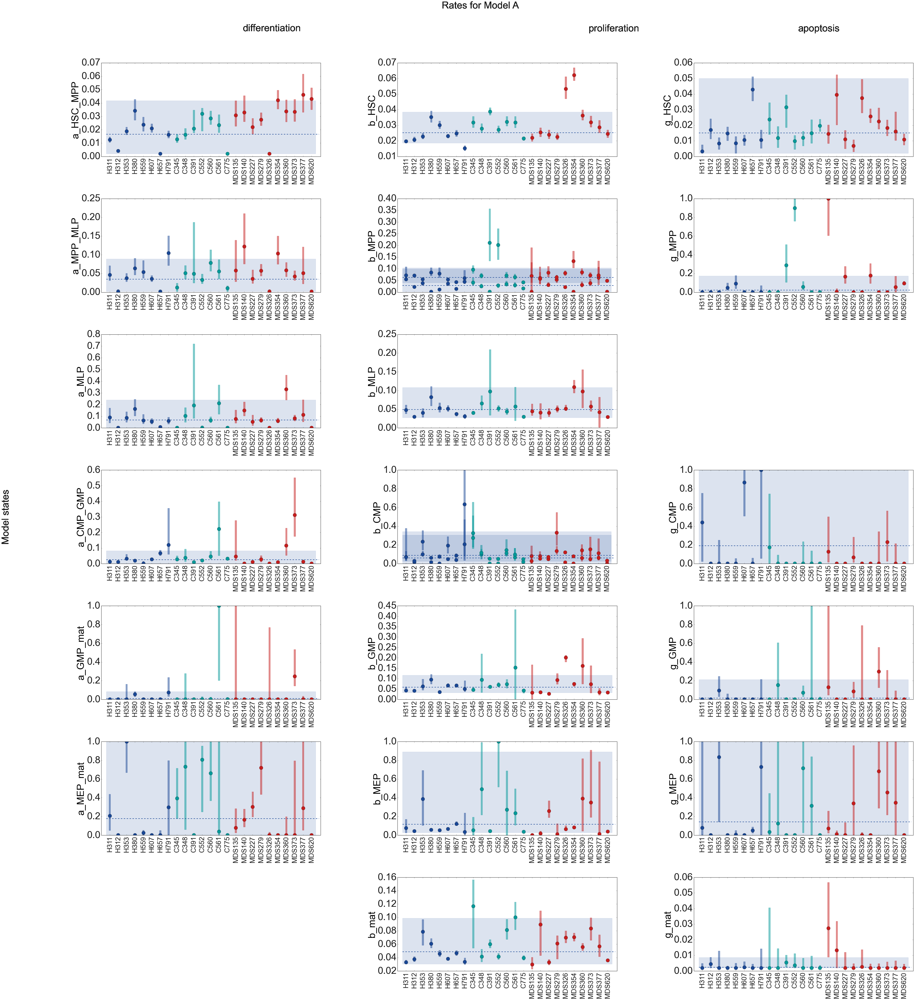

In [17]:
par_T = 'lin'
rot_deg = 90
opt_comparison = 'H_age_matched_vs_CHIP_vs_MDS'
colors = cols_H_vs_CHIP_vs_MDS 
bool_test_par = False
#alpha_errorband = 0.01
alpha_errorband = 0.01
os.chdir(dir_str)
plot_par_with_CI_vs_individuals(dir_str, matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

a_HSC_MPP up-regulated in: MDS354,MDS377,MDS620
b_HSC up-regulated in: C391,MDS326,MDS354
a_MPP_MLP up-regulated in: MDS140,MDS354
b_MPP up-regulated in: C391,C552,MDS354
b_MPP down-regulated in: MDS135
g_MPP up-regulated in: C391,C552,MDS135,MDS354
a_MLP up-regulated in: MDS360
b_MLP up-regulated in: MDS354
a_CMP_GMP up-regulated in: C561,MDS360,MDS373
a_GMP_mat up-regulated in: C561,MDS373
b_GMP up-regulated in: C561,MDS326,MDS360
b_GMP down-regulated in: MDS227
g_GMP up-regulated in: MDS360
b_MEP up-regulated in: C552
b_MEP down-regulated in: MDS135,MDS140,MDS279,MDS377
b_mat up-regulated in: C345,C561
b_mat down-regulated in: MDS135
g_mat up-regulated in: MDS135,MDS140


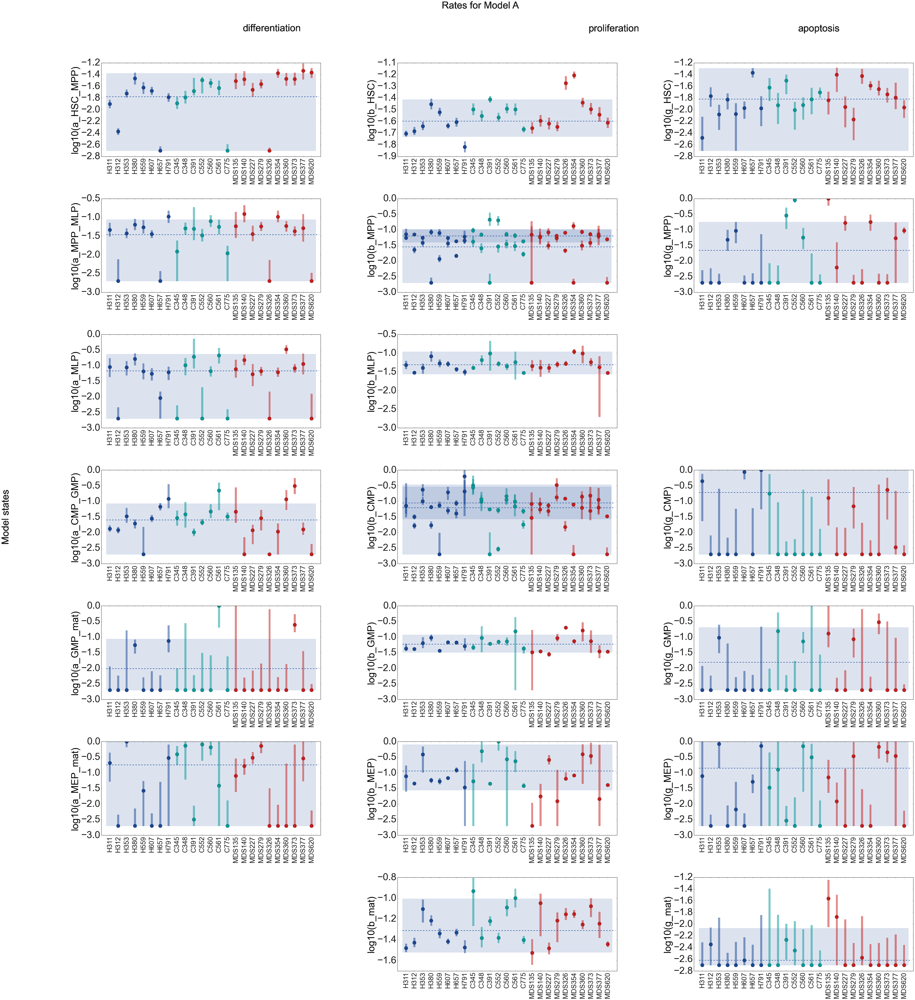

In [18]:
#par_T = 'lin'
par_T = 'log10'
rot_deg = 90
opt_comparison = 'H_age_matched_vs_CHIP_vs_MDS'
colors = cols_H_vs_CHIP_vs_MDS 
bool_test_par = False
alpha_errorband = 0.01
#alpha_errorband = 0.05
os.chdir(dir_str)
plot_par_with_CI_vs_individuals(dir_str,matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

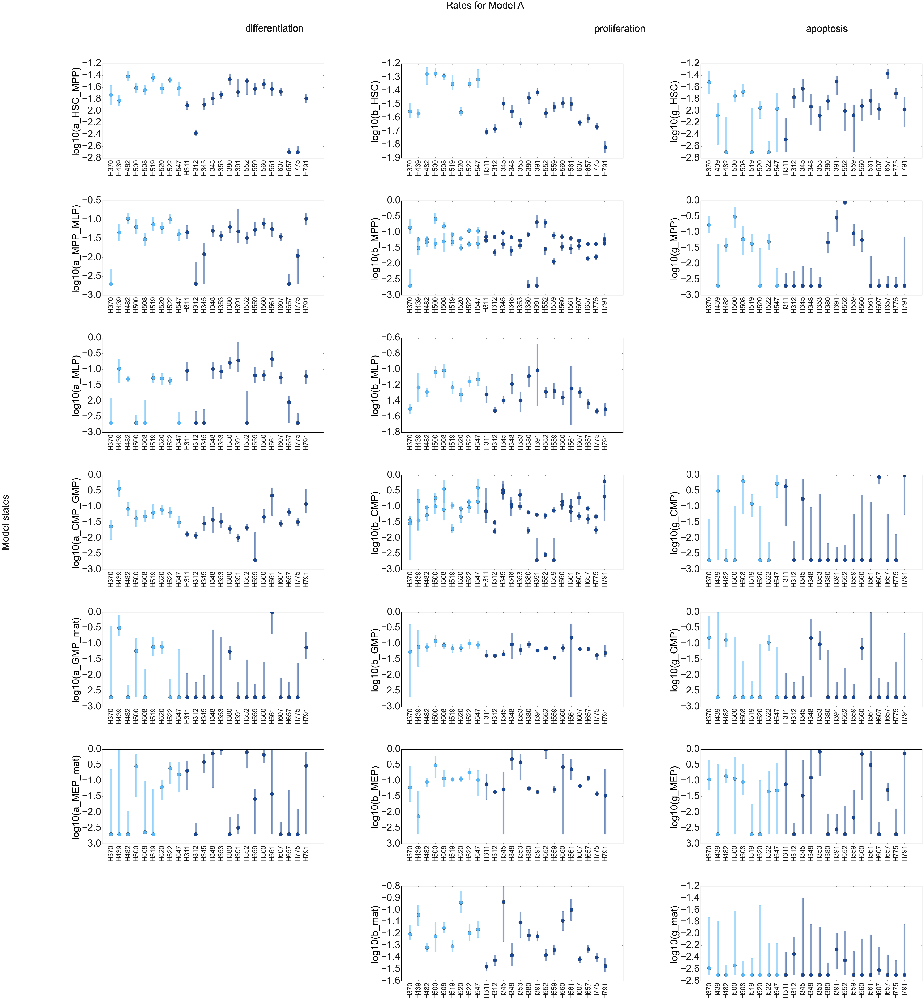

In [19]:
#par_T = 'lin'
par_T = 'log10'
rot_deg = 90
opt_comparison = 'H_young_vs_H_aged'
bool_test_par = False
colors = cols_H_y_vs_H_a 
alpha_errorband = 0.01
#alpha_errorband = 0.05
plot_par_with_CI_vs_individuals(dir_str, matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

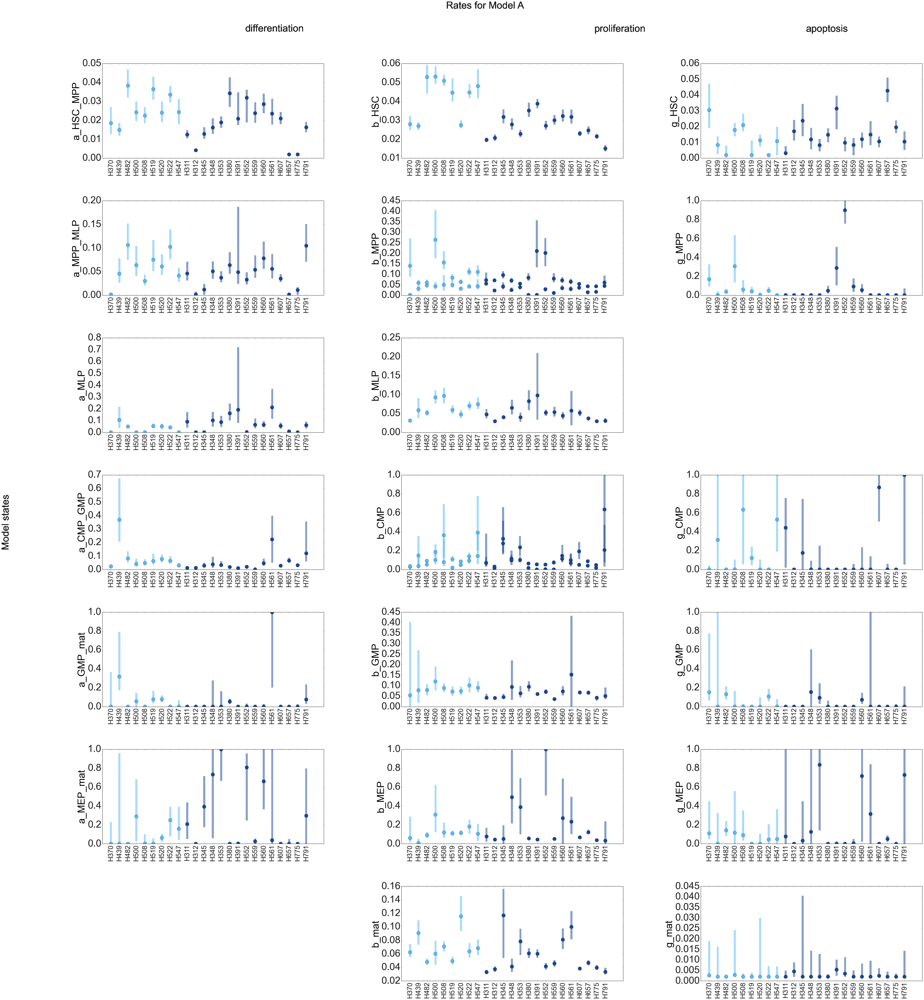

In [20]:
par_T = 'lin'
#par_T = 'log10'
rot_deg = 90
opt_comparison = 'H_young_vs_H_aged'
bool_test_par = False
colors = cols_H_y_vs_H_a 
alpha_errorband = 0.01
#alpha_errorband = 0.05
plot_par_with_CI_vs_individuals(dir_str, matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

a_HSC_MPP up-regulated in: MDS354,MDS377,MDS620
b_HSC up-regulated in: MDS326,MDS354
a_MPP_MLP up-regulated in: MDS140,MDS354
b_MPP down-regulated in: MDS135
g_MPP up-regulated in: MDS135
a_MLP up-regulated in: MDS360
a_CMP_GMP up-regulated in: MDS373
b_CMP down-regulated in: MDS135
b_GMP up-regulated in: MDS326,MDS360
b_GMP down-regulated in: MDS227
g_GMP up-regulated in: MDS360
b_MEP down-regulated in: MDS135,MDS279
b_mat down-regulated in: MDS135
g_mat up-regulated in: MDS135,MDS140


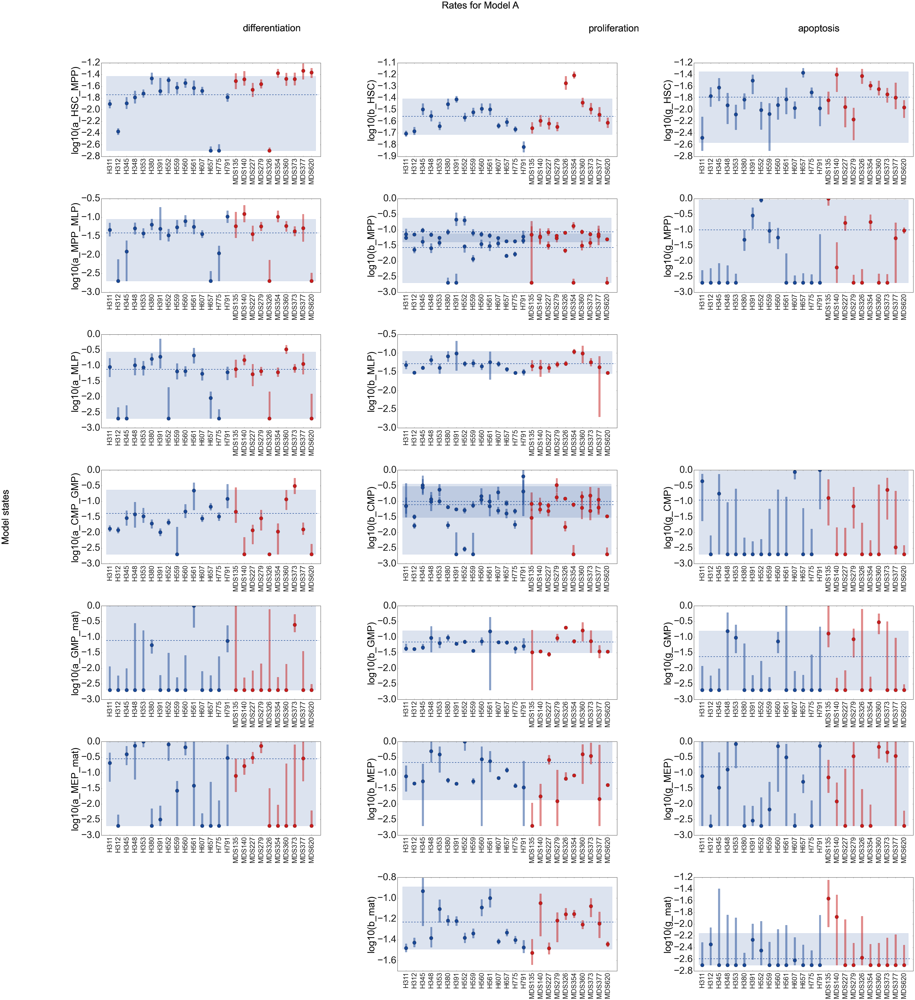

In [21]:
#par_T = 'lin'
par_T = 'log10'
rot_deg = 90
opt_comparison = 'H_age_matched_vs_MDS'
colors = cols_H_vs_MDS 
bool_test_par = False
#alpha_errorband = 0.01
alpha_errorband = 0.05
plot_par_with_CI_vs_individuals(dir_str, matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

a_HSC_MPP up-regulated in: MDS354,MDS377,MDS620
b_HSC up-regulated in: MDS326,MDS354
a_MPP_MLP up-regulated in: MDS140,MDS354
b_MPP down-regulated in: MDS135
g_MPP up-regulated in: MDS135
a_MLP up-regulated in: MDS360
a_CMP_GMP up-regulated in: MDS373
b_CMP down-regulated in: MDS135
b_GMP up-regulated in: MDS326
b_GMP down-regulated in: MDS227
g_GMP up-regulated in: MDS360
b_MEP down-regulated in: MDS135
b_mat down-regulated in: MDS135
g_mat up-regulated in: MDS135,MDS140


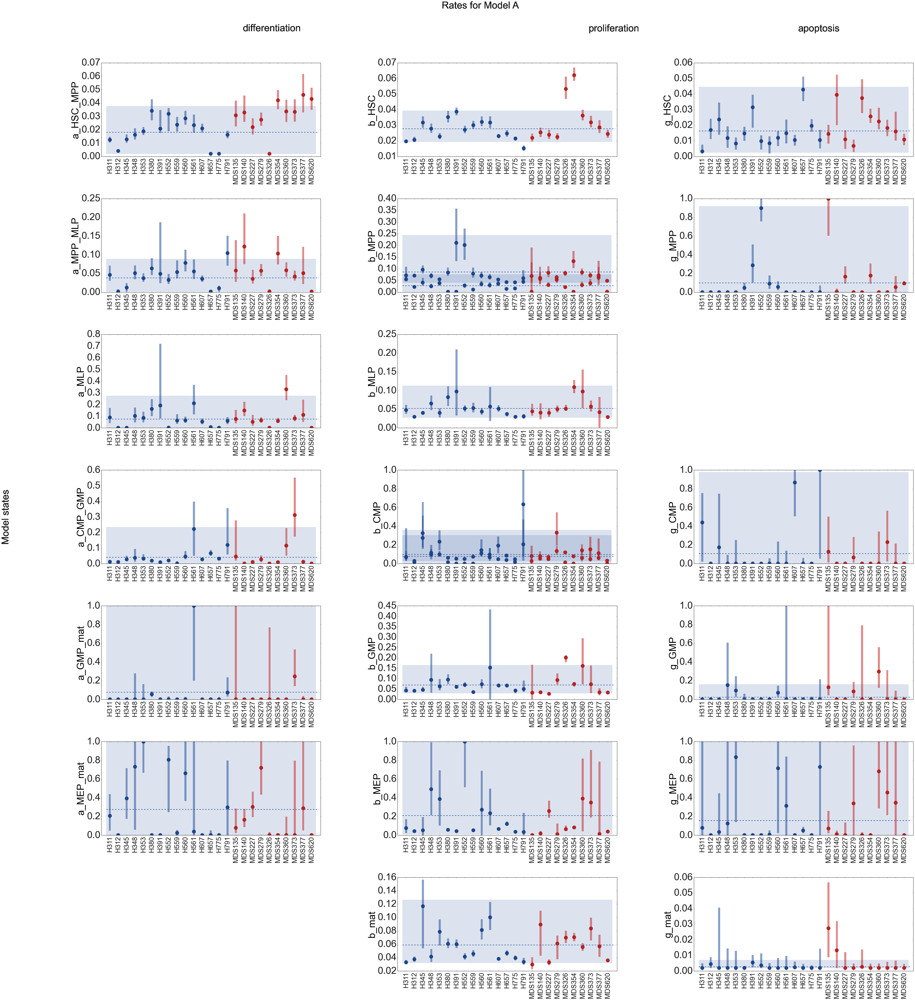

In [22]:
par_T = 'lin'
#par_T = 'log10'
rot_deg = 90
opt_comparison = 'H_age_matched_vs_MDS'
colors = cols_H_vs_MDS 
bool_test_par = False
#alpha_errorband = 0.01
alpha_errorband = 0.05
plot_par_with_CI_vs_individuals(dir_str, matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS, subsubfolder_str_H_MDS, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T, colors, opt_comparison, rot_deg, opt_sample_ID,bool_fit_repetitions_seperately,False,alpha_errorband,opt_save)

### Map parameter estimates of all individuals to patient data

In [23]:
model_of_interest = 'model_A'
M_names_opt = list(model_of_interest[len(model_of_interest)-1])
opt_mutations_of_interest = 'combined'
bool_identifiablePars_only=True

#### load data frames

In [24]:
mutations_of_interest_str = ''
opt_mutations_of_interest = 'combined'
df_PD, mutation_str = load_patient_data_frame(samples_excluded_H,samples_excluded_MDS,opt_mutations_of_interest,opt_sample_ID,dir_str)
#len(df_PD['Sample_ID'].unique())

In [25]:
#df_PD[['Sample_ID','Mutation_counts']]

In [26]:
len(np.unique(df_PD[df_PD['group']=='healthy']['Sample_ID']))

17

In [27]:
df_PD.head()

,Sample_ID,group,year_of_birth,acquisition_date_of_the_BM_sample,age,sex,karyotype,dysplasia_erythropoiesis,sideroblasts,dysplastic_granulopoiesis,...,IDH2_VAF,GATA1_VAF,TP53_VAF,STAG2_VAF,WT1_VAF,KRAS_VAF,NFE2_VAF,Mutation_counts,number_data_points,weight_data
0,MDS135,MDS,1939.0,2014-06-23,77.0,m,46 XY [20],yes,>15%,yes,...,0,0,0,NaN,51,0,0,4,4,0.016393
1,MDS360,MDS,1963.0,2017-03-22,54.0,m,46 XY [20],yes,>15%,yes,...,0,0,0,0,0,0,0,2,5,0.020492
2,MDS227,MDS,1947.0,2015-09-28,68.0,f,46 XX [20],yes,30%,yes,...,0,0,0,0,0,0,0,2,7,0.028689
3,MDS373,MDS,1957.0,2017-04-26,60.0,m,46 XY [20],yes,yes,yes,...,0,0,0,0,0,0,0,3,5,0.020492
4,MDS377,MDS,1953.0,2017-05-10,64.0,f,45 XX -7 [20],yes,no,no,...,0,0,0,NaN,0,0,0,3,3,0.012295


#### get parameter result per sample for particular model & merge patient data frame and parameter results data frame

In [28]:
#get parameter result data frame
par_T = 'lin' 
bool_with_weights = True
bool_identifiablePars_only = False#True#
bool_test_par=False
bool_CIs = True
bool_boundaries=False
path_matlab_result=matlab_dir_str + folder_str_H_MDS[0] + subfolder_str_H_MDS[0] 

df_PAR = get_par_estimates(path_matlab_result , last_subsubfolder_str, M_names_opt, CT, par_T, bool_identifiablePars_only,bool_with_weights,bool_test_par,bool_CIs,bool_boundaries,bool_fit_repetitions_seperately)

#merge the two data frames
if bool_fit_repetitions_seperately:
    DF = pd.merge(df_PAR,df_PD, on='Sample_ID_long', how='inner')
    opt_sample_ID = 'long'
else:
    DF = pd.merge(df_PAR,df_PD, on='Sample_ID', how='inner')
    opt_sample_ID = 'short'
ratenames = DF.columns[np.logical_and(np.logical_and(np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w_CI')==False),DF.columns.str.endswith('_CI_l')==False),DF.columns.str.endswith('CI_u')==False)]


In [29]:
path_matlab_result

'D:\\Documents\\MATLAB\\HematopoieticDisorderAnalysis\\MATLAB\\parameter_inference/results_fit_samples_7divs_3iS_HO_LogNormal_fit_iC/model_A/'

In [30]:
DF.head(5)

,Model,Sample_ID_long,Sample_ID,a_HSC_MPP,a_HSC_MPP_CI_l,a_HSC_MPP_CI_u,a_HSC_MPP_w_CI,b_HSC,b_HSC_CI_l,b_HSC_CI_u,...,IDH2_VAF,GATA1_VAF,TP53_VAF,STAG2_VAF,WT1_VAF,KRAS_VAF,NFE2_VAF,Mutation_counts,number_data_points,weight_data
0,A,H311,H311,0.012525,0.010609,0.014711,0.029935,0.019718,0.018663,0.020891,...,0,0,0,0,0,0,0,0,13,0.053279
1,A,H312,H312,0.004239,0.003746,0.004788,0.117832,0.020706,0.019304,0.022489,...,0,0,0,0,0,0,0,0,18,0.073770
2,A,H345,H345,0.012807,0.010415,0.016384,0.020568,0.031816,0.028536,0.035751,...,0,0,0,0,0,0,0,1,6,0.024590
3,A,H348,H348,0.016276,0.012908,0.020997,0.015178,0.027904,0.025225,0.031059,...,0,0,0,0,0,0,25,2,7,0.028689
4,A,H353,H353,0.018866,0.016208,0.022031,0.021086,0.022851,0.021228,0.024907,...,0,0,0,0,0,0,0,0,7,0.028689


In [31]:
len(np.unique(DF[DF['group']=='healthy']['Sample_ID']))

17

### significant differences in rates between ASXL1 mutated vs non-mutated MDS patients?

In [32]:
R_ASXL1_pos = DF[np.logical_and(DF['Sample_ID_long'].str.startswith('MDS'), DF['ASXL1']!='no')]['a_HSC_MPP']
R_ASXL1_neg = DF[np.logical_and(DF['Sample_ID_long'].str.startswith('MDS'), DF['ASXL1']=='no')]['a_HSC_MPP']

In [33]:
stats.mannwhitneyu(R_ASXL1_pos, R_ASXL1_neg, alternative='greater')

MannwhitneyuResult(statistic=18.0, pvalue=0.12047733435078506)

In [34]:
#plt.plot([0,0,0,0,0,0],R_ASXL1_pos,'*r')
#plt.plot([1,1,1,1],R_ASXL1_neg,'*b')

In [35]:
ratenames

Index(['a_HSC_MPP', 'b_HSC', 'g_HSC', 'a_MPP_MLP', 'a_MPP_CMP', 'b_MPP',
       'g_MPP', 'a_MLP', 'b_MLP', 'a_CMP_GMP', 'a_CMP_MEP', 'b_CMP', 'g_CMP',
       'a_GMP_mat', 'b_GMP', 'g_GMP', 'a_MEP_mat', 'b_MEP', 'g_MEP', 'b_mat',
       'g_mat'],
      dtype='object')

#### mean weighted parameter healthy age-matched in [h]

In [36]:
#calculate weights
for r_id,rate in enumerate(ratenames):
    DF[rate+'_w'] = (DF[rate+'_w_CI']+DF['weight_data'])/2

In [37]:
DF.head(5)

,Model,Sample_ID_long,Sample_ID,a_HSC_MPP,a_HSC_MPP_CI_l,a_HSC_MPP_CI_u,a_HSC_MPP_w_CI,b_HSC,b_HSC_CI_l,b_HSC_CI_u,...,b_CMP_w,g_CMP_w,a_GMP_mat_w,b_GMP_w,g_GMP_w,a_MEP_mat_w,b_MEP_w,g_MEP_w,b_mat_w,g_mat_w
0,A,H311,H311,0.012525,0.010609,0.014711,0.029935,0.019718,0.018663,0.020891,...,0.034655,0.027029,0.049859,0.050669,0.053544,0.027579,0.032459,0.027019,0.070141,0.052786
1,A,H312,H312,0.004239,0.003746,0.004788,0.117832,0.020706,0.019304,0.022489,...,0.113295,0.083754,0.094073,0.102347,0.105105,0.177900,0.130543,0.183988,0.071816,0.047943
2,A,H345,H345,0.012807,0.010415,0.016384,0.020568,0.031816,0.028536,0.035751,...,0.014620,0.012678,0.040075,0.040496,0.046229,0.012968,0.016638,0.013144,0.014860,0.014238
3,A,H348,H348,0.016276,0.012908,0.020997,0.015178,0.027904,0.025225,0.031059,...,0.026978,0.017466,0.015134,0.017462,0.014777,0.014730,0.015424,0.014724,0.028148,0.020394
4,A,H353,H353,0.018866,0.016208,0.022031,0.021086,0.022851,0.021228,0.024907,...,0.028051,0.015486,0.015692,0.025322,0.015555,0.015438,0.015761,0.014787,0.021155,0.021216


In [38]:
#get dataframes sorted by group comparison H age matched vs. MDS
DF, DF_H, DF_CHIP, DF_MDS, lab_str1, lab_str2, lab_str3 = get_dataframe_selection(DF,'H_age_matched_vs_CHIP_vs_MDS',opt_sample_ID)

In [39]:
DF_CHIP

,Model,Sample_ID_long,Sample_ID,a_HSC_MPP,a_HSC_MPP_CI_l,a_HSC_MPP_CI_u,a_HSC_MPP_w_CI,b_HSC,b_HSC_CI_l,b_HSC_CI_u,...,b_CMP_w,g_CMP_w,a_GMP_mat_w,b_GMP_w,g_GMP_w,a_MEP_mat_w,b_MEP_w,g_MEP_w,b_mat_w,g_mat_w
0,A,H345,H345,0.012807,0.010415,0.016384,0.020568,0.031816,0.028536,0.035751,...,0.014620,0.012678,0.040075,0.040496,0.046229,0.012968,0.016638,0.013144,0.014860,0.014238
1,A,H348,H348,0.016276,0.012908,0.020997,0.015178,0.027904,0.025225,0.031059,...,0.026978,0.017466,0.015134,0.017462,0.014777,0.014730,0.015424,0.014724,0.028148,0.020394
2,A,H391,H391,0.020867,0.017661,0.034755,0.007182,0.038816,0.036490,0.041254,...,0.081802,0.105739,0.070637,0.059752,0.081617,0.069268,0.096552,0.073092,0.037478,0.026192
3,A,H552,H552,0.032000,0.019046,0.036140,0.007182,0.027134,0.025122,0.029683,...,0.045596,0.078402,0.015702,0.036398,0.025570,0.008710,0.009919,0.035007,0.036737,0.016318
4,A,H560,H560,0.028526,0.023948,0.034035,0.012171,0.032253,0.029497,0.035670,...,0.025825,0.015567,0.023398,0.027898,0.016611,0.014917,0.015562,0.014733,0.023065,0.026445
5,A,H561,H561,0.023513,0.017886,0.031366,0.009108,0.031810,0.028411,0.035697,...,0.022120,0.016420,0.014617,0.015696,0.014606,0.014707,0.016492,0.014797,0.020650,0.024147
6,A,H775,H775,0.002000,0.002000,0.002546,0.224777,0.021511,0.020351,0.022734,...,0.068052,0.048282,0.032421,0.050715,0.032920,0.055794,0.088434,0.057145,0.060601,0.070909


In [40]:
DF_MDS

,Model,Sample_ID_long,Sample_ID,a_HSC_MPP,a_HSC_MPP_CI_l,a_HSC_MPP_CI_u,a_HSC_MPP_w_CI,b_HSC,b_HSC_CI_l,b_HSC_CI_u,...,b_CMP_w,g_CMP_w,a_GMP_mat_w,b_GMP_w,g_GMP_w,a_MEP_mat_w,b_MEP_w,g_MEP_w,b_mat_w,g_mat_w
0,A,MDS135,MDS135,0.030817,0.022678,0.041742,0.010973,0.021988,0.019783,0.024697,...,0.027522,0.009186,0.008453,0.012795,0.008496,0.012655,0.142811,0.012926,0.046382,0.012838
1,A,MDS140,MDS140,0.032945,0.025999,0.045537,0.010707,0.025422,0.022697,0.028440,...,0.042253,0.046094,0.093948,0.126671,0.104049,0.014217,0.036827,0.032048,0.018155,0.015635
2,A,MDS227,MDS227,0.021984,0.016624,0.028512,0.017597,0.024008,0.021470,0.026988,...,0.055899,0.053955,0.054820,0.096285,0.058183,0.018645,0.020969,0.022725,0.093877,0.036423
3,A,MDS279,MDS279,0.027482,0.023199,0.032716,0.021979,0.022568,0.020773,0.024825,...,0.027037,0.016115,0.035790,0.029059,0.016082,0.016393,0.024247,0.015505,0.033345,0.095037
4,A,MDS326,MDS326,0.002000,0.002000,0.002238,0.878403,0.053261,0.047078,0.061182,...,0.052769,0.038596,0.012628,0.036261,0.012656,0.050923,0.038151,0.051764,0.049657,0.031256
5,A,MDS354,MDS354,0.042039,0.035489,0.049583,0.014843,0.062180,0.058622,0.066875,...,0.060938,0.146825,0.095921,0.052115,0.100511,0.170009,0.082486,0.160545,0.069766,0.101785
6,A,MDS360,MDS360,0.033774,0.025831,0.042371,0.012647,0.036290,0.033378,0.039919,...,0.020011,0.011650,0.032506,0.013702,0.010905,0.016135,0.011792,0.011806,0.072657,0.090430
7,A,MDS373,MDS373,0.033380,0.026263,0.042728,0.012705,0.031932,0.028872,0.035984,...,0.015030,0.011139,0.010904,0.016022,0.011162,0.011702,0.011912,0.011663,0.030080,0.067861
8,A,MDS377,MDS377,0.046148,0.033161,0.061643,0.007345,0.028676,0.025146,0.033173,...,0.020481,0.008398,0.013855,0.029363,0.009226,0.007370,0.007670,0.007258,0.026665,0.054197
9,A,MDS620,MDS620,0.042990,0.035028,0.051372,0.012800,0.024457,0.022146,0.026973,...,0.305108,0.285091,0.268224,0.214776,0.295778,0.309001,0.250184,0.300810,0.186465,0.121586


In [41]:
DF_H

,Model,Sample_ID_long,Sample_ID,a_HSC_MPP,a_HSC_MPP_CI_l,a_HSC_MPP_CI_u,a_HSC_MPP_w_CI,b_HSC,b_HSC_CI_l,b_HSC_CI_u,...,b_CMP_w,g_CMP_w,a_GMP_mat_w,b_GMP_w,g_GMP_w,a_MEP_mat_w,b_MEP_w,g_MEP_w,b_mat_w,g_mat_w
0,A,H311,H311,0.012525,0.010609,0.014711,0.029935,0.019718,0.018663,0.020891,...,0.034655,0.027029,0.049859,0.050669,0.053544,0.027579,0.032459,0.027019,0.070141,0.052786
1,A,H312,H312,0.004239,0.003746,0.004788,0.117832,0.020706,0.019304,0.022489,...,0.113295,0.083754,0.094073,0.102347,0.105105,0.177900,0.130543,0.183988,0.071816,0.047943
2,A,H353,H353,0.018866,0.016208,0.022031,0.021086,0.022851,0.021228,0.024907,...,0.028051,0.015486,0.015692,0.025322,0.015555,0.015438,0.015761,0.014787,0.021155,0.021216
3,A,H380,H380,0.034254,0.027210,0.042645,0.007954,0.035233,0.031970,0.039227,...,0.055400,0.069834,0.014330,0.022852,0.014606,0.081234,0.051037,0.064835,0.028894,0.071073
4,A,H559,H559,0.023766,0.018801,0.029517,0.011457,0.030113,0.027901,0.032776,...,0.037639,0.019508,0.083791,0.094227,0.097018,0.021317,0.050428,0.022053,0.042149,0.039558
5,A,H607,H607,0.020989,0.018036,0.024423,0.019222,0.023063,0.021848,0.024362,...,0.031244,0.027221,0.062625,0.061391,0.069617,0.148260,0.081532,0.153647,0.082733,0.045519
6,A,H657,H657,0.002000,0.002000,0.002336,0.364932,0.024751,0.022770,0.026842,...,0.046219,0.027451,0.078391,0.055237,0.086337,0.030007,0.041416,0.028361,0.058415,0.053393
7,A,H791,H791,0.016328,0.013804,0.019146,0.022982,0.015204,0.013718,0.016929,...,0.016212,0.014646,0.015416,0.025296,0.015577,0.014800,0.017895,0.014724,0.041516,0.020432


In [42]:
#weighted mean and std of weighted mean group healthy age matched:
par_mean_w_H = [0]*len(ratenames)
par_std_w_H = [0]*len(ratenames)
for r_id,rate in enumerate(ratenames):
    weighted_stats_H = DescrStatsW(DF_H[rate], weights=DF_H[rate+'_w'], ddof=0)
    par_mean_w_H[r_id] = weighted_stats_H.mean
    par_std_w_H[r_id] = weighted_stats_H.std    

In [43]:
DF_weighted_mean_and_std_H = pd.DataFrame({'rate':ratenames,'weighted mean healthy age-matched':par_mean_w_H,'std of weighted mean healthy age-matched':par_std_w_H})
DF_weighted_mean_and_std_H

,rate,weighted mean healthy age-matched,std of weighted mean healthy age-matched
0,a_HSC_MPP,0.008527,0.008700
1,b_HSC,0.022691,0.004841
2,g_HSC,0.013706,0.010976
3,a_MPP_MLP,0.019573,0.026721
4,a_MPP_CMP,0.018660,0.020697
5,b_MPP,0.056765,0.012685
6,g_MPP,0.006021,0.017300
7,a_MLP,0.039066,0.043343
8,b_MLP,0.041060,0.012569
9,a_CMP_GMP,0.023692,0.024772


#### HSC cell cycle length for MDS326 and MDS354

In [44]:
p_id = ['MDS326','MDS354']
for i in range(0,2):
    print('cell cyle length '+p_id[i]+':'+str(1/DF[DF['Sample_ID']==p_id[i]]['b_HSC'].to_numpy())+' and 95% confidence interval: '+ str(1/DF[DF['Sample_ID']==p_id[i]]['b_HSC_CI_u'].to_numpy()) + ',' + str(1/DF[DF['Sample_ID']==p_id[i]]['b_HSC_CI_l'].to_numpy()))

cell cyle length MDS326:[18.7754] and 95% confidence interval: [16.3448],[21.2413]
cell cyle length MDS354:[16.0825] and 95% confidence interval: [14.9533],[17.0585]


### Age vs parameter estimates

In [45]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

In [46]:
par_T = 'lin' 
bool_CIs = True
bool_with_weights = False
bool_identifiablePars_only = False
bool_test_par=False
df_PAR = get_par_estimates(path_matlab_result, last_subsubfolder_str, M_names_opt, CT, par_T, bool_identifiablePars_only,bool_with_weights,bool_test_par,bool_CIs,bool_boundaries,bool_fit_repetitions_seperately)


In [47]:
np.unique(df_PAR['Sample_ID_long'])

array(['H311', 'H312', 'H345', 'H348', 'H353', 'H370', 'H380', 'H391',
       'H439', 'H482', 'H500', 'H508', 'H519', 'H520', 'H522', 'H547',
       'H552', 'H559', 'H560', 'H561', 'H607', 'H657', 'H775', 'H791',
       'MDS135', 'MDS140', 'MDS227', 'MDS279', 'MDS326', 'MDS354',
       'MDS360', 'MDS373', 'MDS377', 'MDS620'], dtype=object)

In [48]:
#merge data frames
if bool_fit_repetitions_seperately:
    DF = pd.merge(df_PAR,df_PD, on='Sample_ID_long', how='inner')
else:
    DF = pd.merge(df_PAR,df_PD, on='Sample_ID', how='inner')
ratenames = DF.columns[np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w')==False)]

In [49]:
bool_per_day = True
bool_plot_IDs = False
ratenames = DF.columns[np.logical_and(np.logical_and(np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w_CI')==False),DF.columns.str.endswith('_CI_l')==False),DF.columns.str.endswith('CI_u')==False)]
if bool_per_day and par_T=='ratio':
    DF_day = DF.copy()
    DF_day[ratenames] = DF[ratenames]

In [50]:
len(DF[DF['group']=='healthy']['Sample_ID'])

17

In [51]:
#1/DF[DF['age']==79]['b_HSC']
#bool_identifiablePars_only
plt = loadPltSettings(30,40)

In [52]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

In [53]:
#DF[['age','a_HSC_MPP_CI_u']]

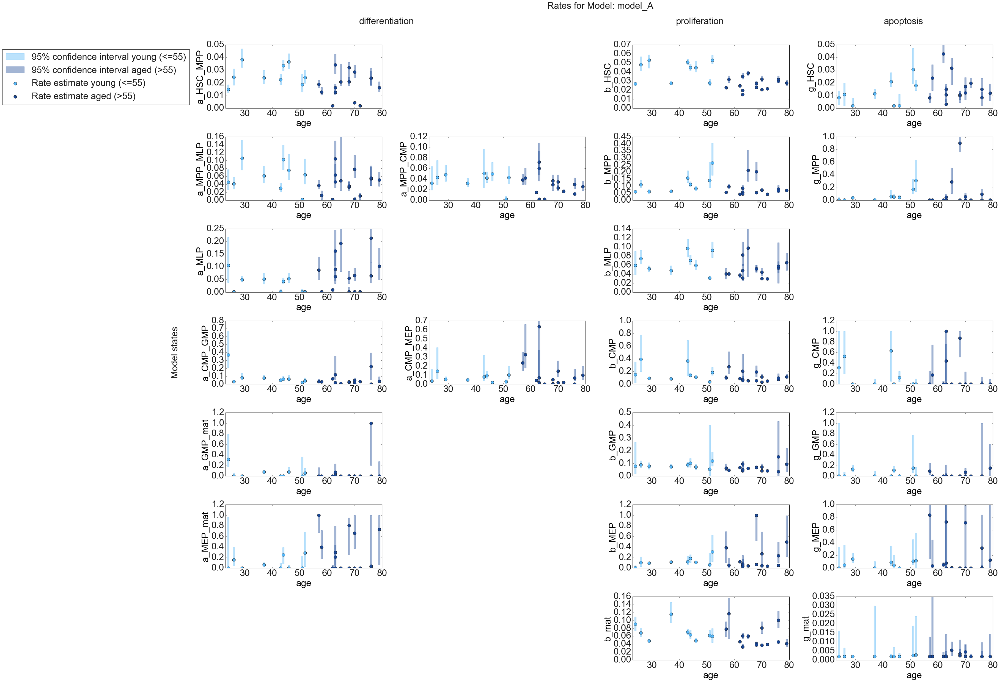

In [54]:
opt_comparison = 'H_young_vs_H_aged_with_CHIP'
opt_regression_line=False
opt_plot_CIs = True
opt_single_regressionLine = True
opt_log_transform_rates = False #True # if set to True individual rates are first transformed such that normal assumption holds
plot_par_vs_age(DF,matlab_dir_str, par_T, folder_str_H_MDS, subfolder_str_H_MDS, model_of_interest, CT, ratenames,cols_H_y_vs_H_a ,opt_comparison,opt_regression_line,opt_single_regressionLine,bool_plot_IDs,opt_sample_ID,opt_log_transform_rates,opt_plot_CIs,opt_save)

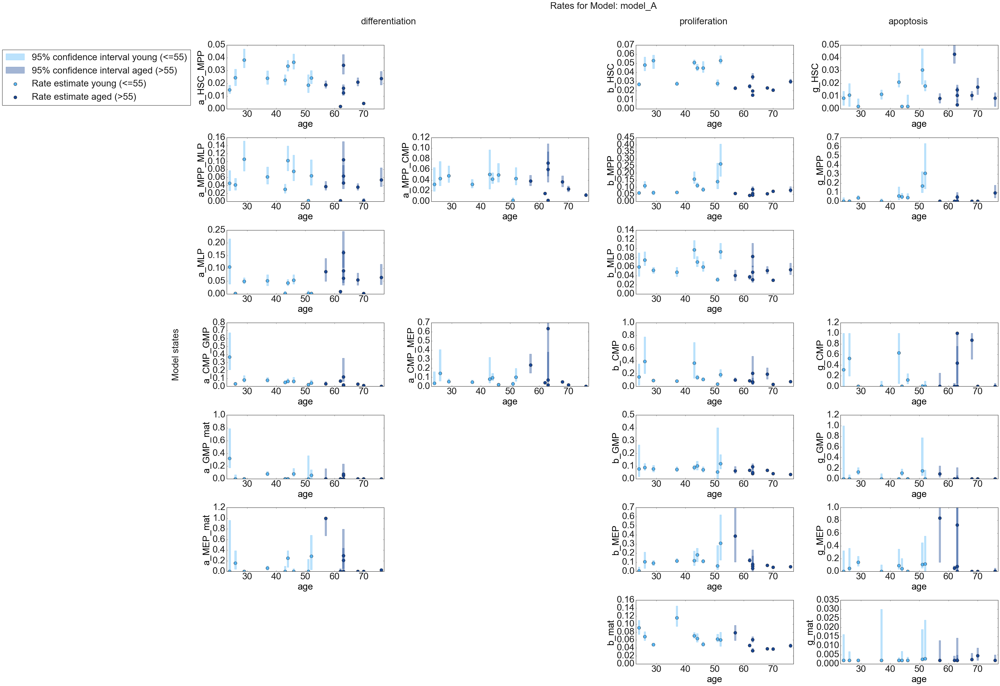

In [55]:
opt_comparison = 'H_young_vs_H_aged_without_CHIP'
opt_single_regressionLine = True
opt_log_transform_rates = False #True # if set to True individual rates are first transformed such that normal assumption holds
plot_par_vs_age(DF,matlab_dir_str, par_T, folder_str_H_MDS, subfolder_str_H_MDS, model_of_interest, CT, ratenames,cols_H_y_vs_H_a ,opt_comparison,opt_regression_line,opt_single_regressionLine,bool_plot_IDs,opt_sample_ID,opt_log_transform_rates,opt_plot_CIs,opt_save)

In [56]:
#j=list(range(1,22))
#t = [1/i for i in j]
#alpha=0.05
#TH = [alpha* k/(np.sum(t)*21) for k in j]
#TH

### Metrics plots

In [57]:
bool_identifiablePars_only=False
bool_with_weights=False
bool_test_par=False
bool_CIs=False
bool_boundaries=False
par_T = 'lin'
path_matlab_result=matlab_dir_str + folder_str_H_MDS[0] + subfolder_str_H_MDS[0] 
df_PAR = get_par_estimates(path_matlab_result, last_subsubfolder_str, M_names_opt, CT, par_T, bool_identifiablePars_only,bool_with_weights,bool_test_par,bool_CIs,bool_boundaries,bool_fit_repetitions_seperately)

In [58]:
if opt_sample_ID=='long':
    I_col = 'Sample_ID_long'
elif opt_sample_ID=='short':
    I_col = 'Sample_ID'
    
DF = pd.merge(df_PAR,df_PD, on=I_col, how='inner')

#add metrics as columns to dataframe
DF = addMetrics2dataframe(DF,par_T,CT)

In [59]:
len(DF[DF['group']=='healthy']['Sample_ID'])

17

In [60]:
#DF.to_excel("parameter_results_and_metrics.xlsx") 

In [61]:
#DF['HSC_accumulation_time']

In [62]:
#DF.columns[DF.columns.str.endswith('ration')]

In [63]:
#DF[(DF['Sample_ID'].str.startswith('H')) & (DF['MEP_cellular_exit_time'].get_values()<8)][['Sample_ID','MEP_cellular_exit_time','age']]

In [64]:
#DF[(DF['Sample_ID'].str.startswith('H')) & (DF['MEP_cellular_exit_time'].get_values()>=8)][['Sample_ID','MEP_cellular_exit_time','age']]

In [65]:
#comp = 'HSC'
#DF[DF['Sample_ID'].str.startswith('H')][comp+'_cellular_exit_time'].mean()

In [66]:
#DF[['Sample_ID','CMP_net_proliferation','age']]

In [67]:
#DF[['HSC_net_proliferation','Sample_ID']][DF['Sample_ID'].str.startswith('MDS')]

In [68]:
#DF['MEP_net_proliferation'][DF['Sample_ID']=='MDS326']

In [155]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

In [156]:
opt_sample_ID

'short'

In [157]:
par_T

'lin'

In [158]:
plt = loadPltSettings(20,50)

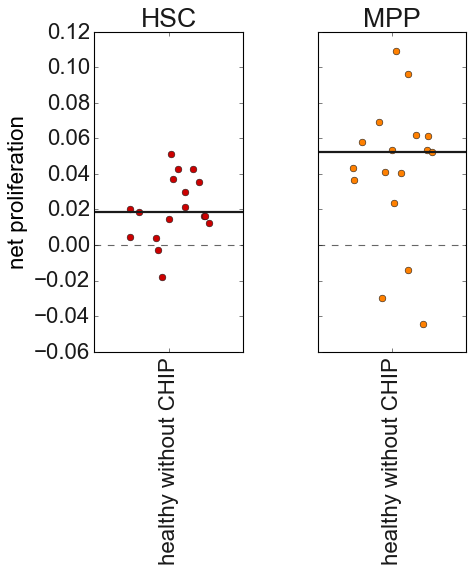

In [159]:
bool_interrupt_axis=False#True#
metric_str = '_net_proliferation'
CT_list = ['HSC','MPP']#,'CMP','GMP','MEP','mat']
MS=6
plot_metrics(path_matlab_result,DF,par_T,metric_str,CT_list,cols_CT,bool_interrupt_axis,MS,'healthy without CHIP',opt_sample_ID,opt_save)

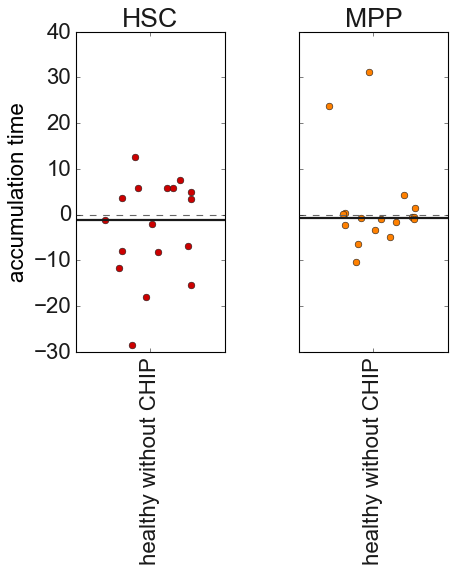

In [160]:
bool_interrupt_axis=False#True#
metric_str = '_accumulation_time'
CT_list = ['HSC','MPP']#,'CMP','GMP','MEP','mat']
MS=6
plot_metrics(path_matlab_result,DF,par_T,metric_str,CT_list,cols_CT,bool_interrupt_axis,MS,'healthy without CHIP',opt_sample_ID,opt_save)

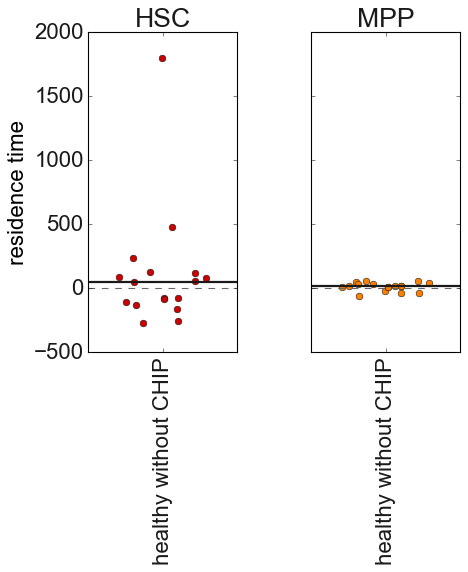

In [161]:
bool_interrupt_axis=False#True#
metric_str = '_residence_time'
CT_list = ['HSC','MPP']
MS=6
plot_metrics(path_matlab_result,DF,par_T,metric_str,CT_list,cols_CT,bool_interrupt_axis,MS,'healthy without CHIP',opt_sample_ID,opt_save)

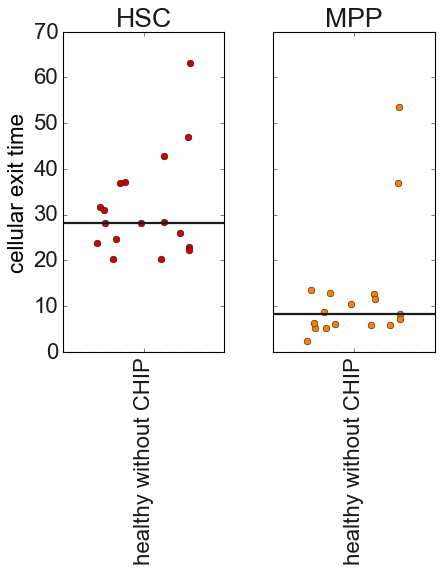

In [162]:
bool_interrupt_axis=False#True#
metric_str = '_cellular_exit_time'
CT_list = ['HSC','MPP']
MS=6
plot_metrics(path_matlab_result,DF,par_T,metric_str,CT_list,cols_CT,bool_interrupt_axis,MS,'healthy without CHIP',opt_sample_ID,opt_save)

9
8
Kruskal Wallis test:
p-value overall differences between groups: 0.03426400773486915
Kruskal Wallis test:
p-value overall differences between groups: 0.01235458501787193


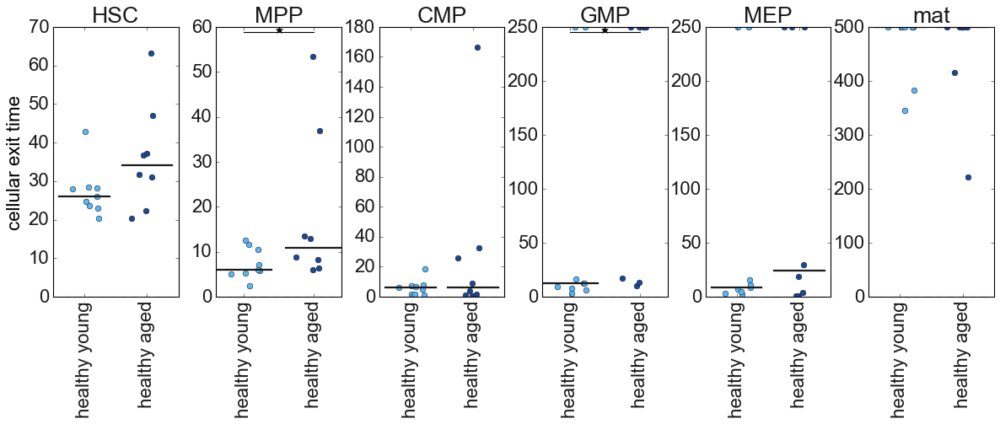

In [163]:
bool_interrupt_axis=False#True#
metric_str = '_cellular_exit_time'
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
MS=6
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_young_vs_H_aged_without_CHIP',opt_sample_ID,opt_save)

9
8


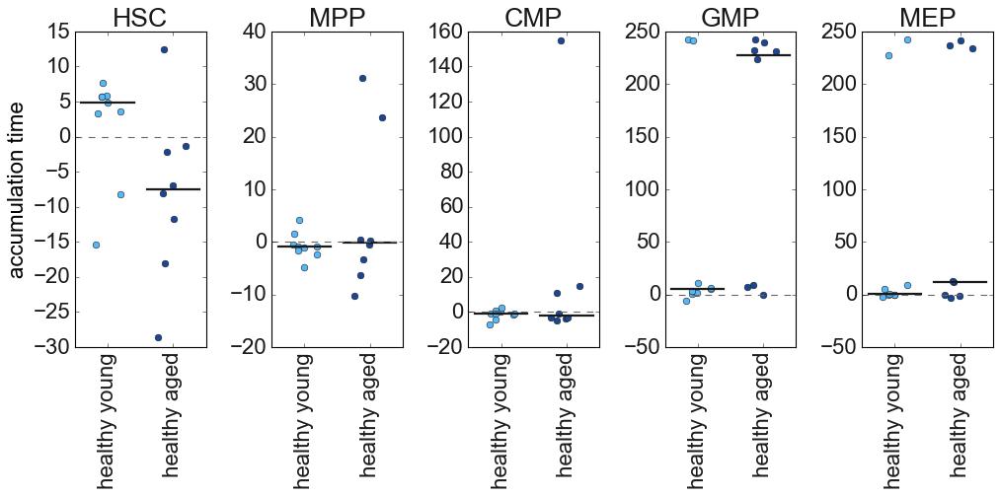

In [164]:
metric_str = '_accumulation_time'
bool_interrupt_axis=False#True#
CT_list = ['HSC','MPP','CMP','GMP','MEP']
MS=6
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_young_vs_H_aged_without_CHIP',opt_sample_ID,opt_save)

9
8
Kruskal Wallis test:
p-value overall differences between groups: 0.020921335337794
Kruskal Wallis test:
p-value overall differences between groups: 0.03426400773486915
Kruskal Wallis test:
p-value overall differences between groups: 0.01235458501787193


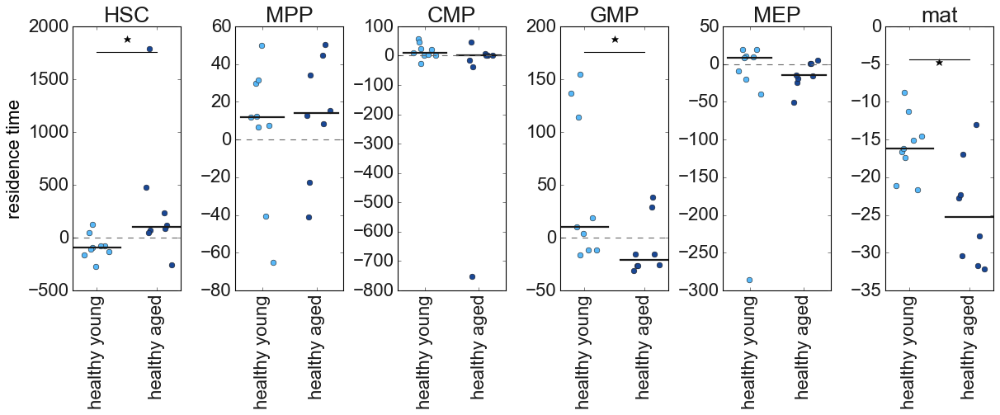

In [165]:
bool_interrupt_axis=False#True#
metric_str = '_residence_time'
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
MS=6
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_young_vs_H_aged_without_CHIP',opt_sample_ID,opt_save)

9
8
Kruskal Wallis test:
p-value overall differences between groups: 0.020921335337794
Kruskal Wallis test:
p-value overall differences between groups: 0.01235458501787193


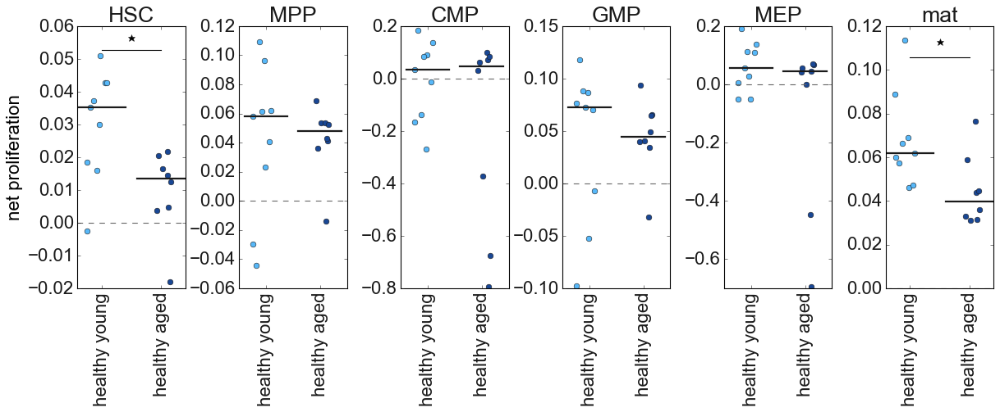

In [166]:
bool_interrupt_axis=False#True#
metric_str = '_net_proliferation'
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
MS=6
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_young_vs_H_aged_without_CHIP',opt_sample_ID,opt_save)

In [167]:
#metric_str = '_cellular_exit_time'
#bool_interrupt_axis=False#True#
#CT_list = ['HSC','MPP','CMP','GMP','MEP']
#MS=6
#plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_age_matched_vs_CHIP_vs_MDS',opt_sample_ID,opt_save)

In [168]:
plt = loadPltSettings(15,40)
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

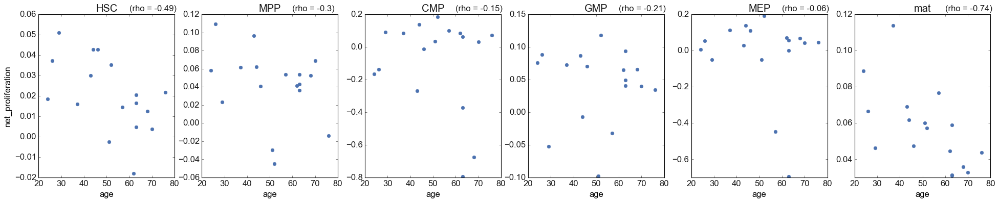

In [169]:
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
metric_str='net_proliferation'
group='healthy'
plot_metric_vs_age(metric_str, CT_list, group, DF, opt_save,path_matlab_result)

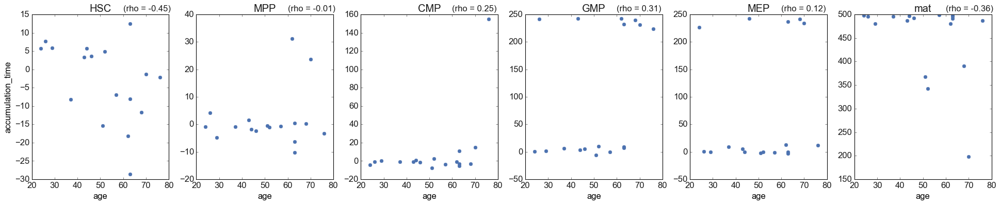

In [170]:
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
metric_str='accumulation_time'
group='healthy'
plot_metric_vs_age(metric_str, CT_list, group, DF, opt_save,path_matlab_result)

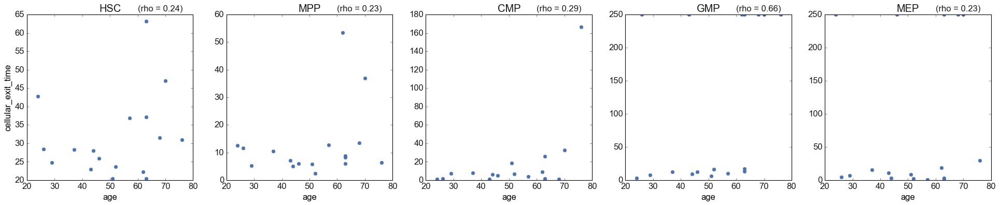

In [171]:
CT_list = ['HSC','MPP','CMP','GMP','MEP']
metric_str='cellular_exit_time'
group='healthy'
plot_metric_vs_age(metric_str, CT_list, group, DF, opt_save,path_matlab_result)

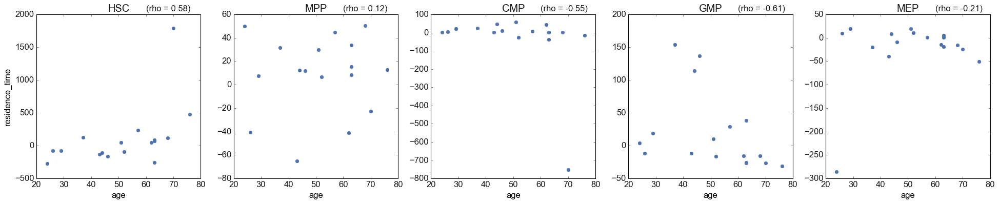

In [172]:
CT_list = ['HSC','MPP','CMP','GMP','MEP']
metric_str='residence_time'
group='healthy'
plot_metric_vs_age(metric_str, CT_list, group, DF, opt_save,path_matlab_result)

In [ ]:
DF['HSC_net_proliferation'][DF['Sample_ID_long'].str.startswith('MDS')]

In [ ]:
DF['HSC_cellular_exit_time'][DF['Sample_ID']=='MDS354']

In [ ]:
DF['HSC_cellular_exit_time'][DF['Sample_ID']=='MDS326']

In [ ]:
DF['HSC_cellular_exit_time'][DF['Sample_ID']=='H312']

In [ ]:
DF['HSC_cellular_exit_time'][DF['Sample_ID']=='H391']

In [ ]:
plt = loadPltSettings(20,80)

In [ ]:
bool_interrupt_axis=False#True#
metric_str = '_net_proliferation'
CT_list = ['HSC','MPP','CMP','GMP','MEP','mat']
MS=6
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_age_matched_vs_CHIP_vs_MDS',opt_sample_ID,opt_save)

In [ ]:
plot_metricComparison(path_matlab_result,DF,par_T,metric_str,CT_list,bool_interrupt_axis,MS,'H_young_vs_H_aged_without_CHIP',opt_sample_ID,opt_save)

#### median compartment-specific net proliferation and cellular exit time

In [ ]:
print('median compartment-specific net proliferation and cellular exit time: ')
print('MPP net proliferation: '+ str((DF[DF['Sample_ID_long'].str.startswith('H')]['MPP_net_proliferation']*24).median()))
print('HSC net proliferation: '+ str((DF[DF['Sample_ID_long'].str.startswith('H')]['HSC_net_proliferation']*24).median()))
print('MPP cellular exit time: '+ str((DF[DF['Sample_ID_long'].str.startswith('H')]['MPP_cellular_exit_time']*24).median()))
print('HSC cellular exit time: '+ str((DF[DF['Sample_ID_long'].str.startswith('H')]['HSC_cellular_exit_time']*24).median()))

In [ ]:
if opt_sample_ID=='long':
    I_col = 'Sample_ID_long'
elif opt_sample_ID=='short':
    I_col = 'Sample_ID'

In [ ]:
par_T = 'lin'
path_matlab_result=matlab_dir_str + folder_str_H_MDS[0] + subfolder_str_H_MDS[0] 
df_PAR = get_par_estimates(path_matlab_result, last_subsubfolder_str, M_names_opt, CT, par_T, bool_identifiablePars_only,bool_with_weights,bool_test_par,bool_CIs,bool_boundaries,bool_fit_repetitions_seperately)

if opt_sample_ID=='long':
    I_col = 'Sample_ID_long'
elif opt_sample_ID=='short':
    I_col = 'Sample_ID'
    
DF = pd.merge(df_PAR,df_PD, on=I_col, how='inner')

#add metrics as columns to dataframe
DF = addMetrics2dataframe(DF,par_T,CT)

DF_H_y = DF[(DF[I_col].str.startswith('H')) & (DF['age']<=55)].copy()
DF_H_a = DF[(DF[I_col].str.startswith('H')) & (DF['age']>55)].copy()
DF_MDS = DF[DF[I_col].str.startswith('MDS')].copy()

In [ ]:
DF_MDS[DF_MDS['Sample_ID_long']=='MDS326']['HSC_net_proliferation']

In [ ]:
DF_MDS[DF_MDS['Sample_ID_long']=='MDS326']['HSC_cellular_exit_time']

In [ ]:
DF_MDS[DF_MDS['Sample_ID_long']=='MDS326']

In [ ]:
1/DF_H_y['a_HSC_MPP']

In [ ]:
1/DF_H_a['a_HSC_MPP']

In [ ]:
1/DF_MDS['a_HSC_MPP']

### PCA of parameter estimates
idea: find the directions of maximum variance in high-dimensional data (parameter estimates) and project it onto a smaller dimensional subspace while retaining most of the information
- PCA is a linear transofrmation method
- PCA yields the directions (principal components) that maximize the variance of the data
- PCA projects the entire dataset onto a different feature (sub)space
- PCA "ignores" class labels
- the eigenvectors (principal components) determine the directions of the new feature space, and the eigenvalues determine their magnitude --> the eigenvalues explain the variance of the data along the new feature axes
- if some eigenvalues have a significantly larger magnitude than others, the reduction of the dataset via PCA onto a smaller dimensional subspace by dropping the "less informative" eigenpairs is reasonable

### weighted PCA: if more data points were available and CIs are small we trust parameter results more --> higher weights fo these observations

In [259]:
#get parameter result data frame
par_T='lin'
bool_with_weights = True#False#
bool_identifiablePars_only = False #True
opt_features = 'rates'
#opt_features = 'metrics'

path_matlab_result=matlab_dir_str + folder_str_H_MDS[0] + subfolder_str_H_MDS[0] 
df_PAR = get_par_estimates(path_matlab_result, last_subsubfolder_str, M_names_opt, CT, par_T, bool_identifiablePars_only,bool_with_weights,False,False,False,bool_fit_repetitions_seperately)

if opt_sample_ID=='long':
    I_col = 'Sample_ID_long'
elif opt_sample_ID=='short':
    I_col = 'Sample_ID'
#merge data frames
DF = pd.merge(df_PAR,df_PD, on=I_col, how='inner')

#calculate weights
for r_id,rate in enumerate(ratenames):
    DF[rate+'_w'] = (DF[rate+'_w_CI']+DF['weight_data'])/2
    
if opt_features == 'rates':
    ratenames = DF.columns[np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w_CI')==False),DF.columns.str.endswith('_CI_l')==False),DF.columns.str.endswith('CI_u')==False),DF.columns.str.endswith('_w')==False)]            
#    ratenames = DF.columns[np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w')==False)]            
    weightnames = DF.columns[np.logical_and(np.logical_or(np.logical_or(DF.columns.str.startswith('a_'),DF.columns.str.startswith('b_')),DF.columns.str.startswith('g_')),DF.columns.str.endswith('_w'))]
elif opt_features == 'metrics':
    #add metrics as columns to dataframe
    DF = addMetrics2dataframe(DF,par_T,CT)
    ratenames = DF.columns[np.logical_or(DF.columns.str.endswith('_cellular_exit_time'),DF.columns.str.endswith('_net_proliferation'))]


D:\Documents\MATLAB\HematopoieticDisorderAnalysis\MATLAB\parameter_inference/results_fit_samples_7divs_3iS_HO_LogNormal_fit_iC/model_A/individual_791
D:\Documents\MATLAB\HematopoieticDisorderAnalysis\MATLAB\parameter_inference/results_fit_samples_7divs_3iS_HO_LogNormal_fit_iC/model_A/individual_620


In [458]:
bool_PCA_based_on_MDS_only = False
bool_PCA_based_on_H_only = False#
bool_only_age_matched = True
bool_only_nonCHIP = False #True
n_comps = len(ratenames)

if bool_only_age_matched:
    min_age_MDS = np.min(DF[DF['Sample_ID_long'].str.startswith('MDS')]['age'])
    DF = DF[(DF['age']>=min_age_MDS)].copy()
    DF.reset_index(inplace=True,drop=True)

mutation_str = DF.columns[DF.columns.str.endswith('VAF')]

X_all = DF[ratenames].copy()
X_all_std = StandardScaler().fit_transform(X_all)
if bool_with_weights:
    W_all = getWeightDataframe(DF[weightnames].copy(),DF['weight_data'].copy())

if bool_PCA_based_on_MDS_only:
    X_MDS = DF[ratenames][DF['Sample_ID_long'].str.startswith('MDS')].copy()
    #parameter:
    X = X_MDS
    #weights
    if bool_with_weights:
        W = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('MDS')].copy(), DF['weight_data'][DF['Sample_ID_long'].str.startswith('MDS')].copy())
    if bool_only_age_matched:
        if bool_only_nonCHIP:
            add_file_str = 'weighted_PCA_based on_MDS_compared2agematched_nonCHIP_individuals'
            X_H = DF[DF['Sample_ID_long'].str.startswith('H') & (np.any(DF[mutation_str].get_values().astype(np.float)>0,axis=1)==False)].copy()
            if bool_with_weights:
                W_H = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('H') & (np.any(DF[mutation_str].get_values().astype(np.float)>0,axis=1)==False)].copy(),DF['weight_data'][DF['Sample_ID_long'].str.startswith('H') & (np.any(DF[mutation_str].get_values().astype(np.float)>0,axis=1)==False)].copy())
        else:
            add_file_str = 'weighted_PCA_based on_MDS_compared2agematched_individuals'
            X_H = DF[DF['Sample_ID_long'].str.startswith('H')].copy()
            if bool_with_weights:
                W_H = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('H')].copy(),DF['weight_data'][DF['Sample_ID_long'].str.startswith('H')].copy())
    else:
        add_file_str = 'weighted_PCA_based on_MDS_compared2all_individuals'
        X_H_y = DF[ratenames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy()
        X_H_a = DF[ratenames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy()
        if bool_with_weights:
            W_H_y = getWeightDataframe(DF[weightnames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy(),DF['weight_data'][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy())
            W_H_a = getWeightDataframe(DF[weightnames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy(),DF['weight_data'][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy())
elif bool_PCA_based_on_H_only:
    if bool_only_age_matched:
        X_H = DF[ratenames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy()
        if bool_with_weights:  
            W = getWeightDataframe(DF[weightnames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy(),DF['weight_data'][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy())
    else:
        X_H = DF[ratenames][DF['Sample_ID_long'].str.startswith('H')].copy()
        if bool_with_weights:
            W = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('H')].copy(),DF['weight_data'][DF['Sample_ID_long'].str.startswith('H')].copy())  
    #parameter:
    X = X_H
    X_MDS = DF[ratenames][DF['Sample_ID_long'].str.startswith('MDS')].copy()
    if bool_only_nonCHIP == False:
        X_CHIP = DF[ratenames][DF['group']=='CHIP'].copy()
    #weights
    if bool_with_weights:
        W_MDS = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('MDS')].copy(), DF['weight_data'][DF['Sample_ID_long'].str.startswith('MDS')].copy())
        if bool_only_nonCHIP == False:
            W_CHIP = getWeightDataframe(DF[weightnames][DF['group']=='CHIP'].copy(), DF['weight_data'][DF['group']=='CHIP'].copy())
else:
    if bool_only_age_matched:
        add_file_str = 'weighted_PCA_based_on_MDS_and_agematched_individuals'
        X_H = DF[ratenames][DF['Sample_ID_long'].str.startswith('H')].copy()
        if bool_with_weights:
            W_H = getWeightDataframe(DF[weightnames][DF['Sample_ID_long'].str.startswith('H')].copy(),DF['weight_data'][DF['Sample_ID_long'].str.startswith('H')].copy())
    else:
        add_file_str = 'weighted_PCA_based_on_all_individuals'
        X_H_y = DF[ratenames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy()
        X_H_a = DF[ratenames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy()
        if bool_with_weights:
            W_H_y = getWeightDataframe(DF[weightnames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy(),DF['weight_data'][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55)].copy())
            W_H_a = getWeightDataframe(DF[weightnames][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy(),DF['weight_data'][(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55)].copy())
    #parameter:
    X = DF[ratenames].copy()
    #weights
    if bool_with_weights:
        W = getWeightDataframe(DF[weightnames].copy(),DF['weight_data'].copy())

X_std = StandardScaler().fit_transform(X)
n_individuals,n_features = np.shape(X)#is updated later

In [459]:
# want features to have mean=0 and variance=1
print('mean: '+str(np.nanmean(X_std,axis=0)))
print('var: '+str(np.nanvar(X_std,axis=0)))

mean: [ 2.1316e-16 -4.4631e-16 -3.5527e-17  3.9080e-16  9.7700e-17  1.1102e-16
 -7.8826e-17 -2.0428e-16  4.7962e-16  1.3323e-17 -1.1102e-16  3.6415e-16
 -2.4425e-17  3.5527e-17  2.2649e-16  4.2188e-17  7.5495e-17  5.3291e-17
 -2.2204e-17  3.3751e-16  4.8850e-17]
var: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [460]:
if bool_with_weights:
    opt_weighted_PCA = True
else:
    opt_weighted_PCA = False
if opt_weighted_PCA:
    mean_vec = np.nanmean(np.multiply(np.array(W),np.array(X_std)),axis=0)/np.sum(np.array(W),axis=0)
    cov_mat = np.divide((np.multiply(np.matrix(W),np.matrix(X_std))).T*(np.multiply(np.matrix(W),np.matrix(X_std))),(np.matrix(W).T * np.matrix(W)))
else:
    mean_vec = np.nanmean(X_std, axis=0)
    cov_mat = (X_std - mean_vec).T.dot((X_std - mean_vec)) / (X_std.shape[0]-1) #or: np.cov(X_std.T)

In [461]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

In [462]:
#eig_vals

In [463]:
#np.shape(cov_mat)

In [464]:
#np.shape(eig_vecs)

In [465]:
#u,s,v = np.linalg.svd(X_std)

In [466]:
for ev in eig_vecs:
    np.testing.assert_array_almost_equal(1.0, np.linalg.norm(ev))
print('Everything ok!')

Everything ok!


In [467]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort()
eig_pairs.reverse()

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
#print('Eigenvalues in descending order:')
#for i in eig_pairs:
#    print(i[0])

In [468]:
#eig_pairs[0][1][1]

In [469]:
plt = loadPltSettings(20,7)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  if sys.path[0] == '':


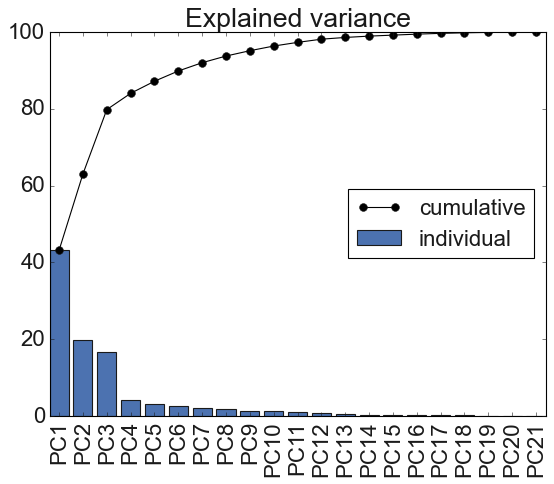

In [470]:
tot = sum(abs(eig_vals[0:n_comps]))
var_exp = [(i / tot)*100 for i in sorted(abs(eig_vals[0:n_comps]), reverse=True)]
cum_var_exp = np.cumsum(var_exp)
var_exp
plot_explained_variance(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,var_exp,'all_pars',opt_save)

Here, we are reducing the 21-dimensional feature space to a 2-dimensional feature subspace, by choosing the "top 2" eigenvectors with the highest eigenvalues to construct our 𝑑×𝑘-dimensional eigenvector matrix 𝐖.

In [471]:
n_features = len(ratenames)
matrix_w = []
for i in range(0,n_comps):
    matrix_w.append(eig_pairs[i][1].reshape(n_features,1))
matrix_w = np.hstack(matrix_w)
#eigenvectors belonging to highest n_comps eigenvalues


#matrix_w = np.hstack((eig_pairs_red[0][1][0:n_comps].reshape(n_comps,1), 
#                      eig_pairs_red[1][1][0:n_comps].reshape(n_comps,1)))
#eigenvectors belonging to highest 2 eigenvalues
np.shape(matrix_w)

(21, 21)

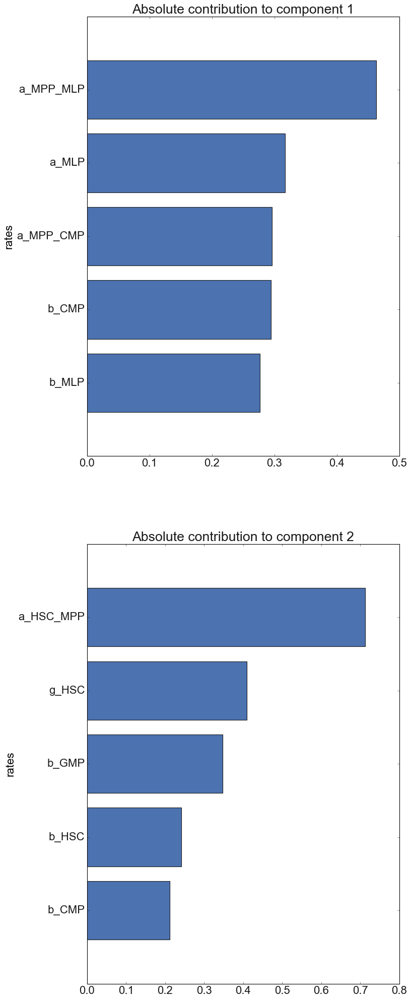

In [472]:
components = np.asarray(matrix_w.T)
method_str = 'PCA'
n_pars=5
plot_contribution2components(matlab_dir_str,folder_str_H_MDS, subfolder_str_H_MDS, components, 2,n_pars,ratenames,add_file_str,method_str,'',opt_save)

projection onto the new feature space: we will use the 21×2-dimensional projection matrix 𝐖 to transform our samples onto the new subspace via the equation
𝐘=𝐗×𝐖, where 𝐘 is a 31×2 matrix of our transformed samples.

In [473]:
opt_weighted_Ellipse=False
W_H_1 = np.array([])
W_H_2 = np.array([])
Y = X_all_std.dot(matrix_w)

In [474]:
#np.shape(Y)

In [475]:
#Y[DF['Sample_ID_long'].str.startswith('MDS'),:]

In [476]:
if bool_PCA_based_on_MDS_only:
    Y_MDS = Y[DF['Sample_ID_long'].str.startswith('MDS'),:]
elif bool_PCA_based_on_H_only:
    if bool_only_age_matched:
        Y_H = Y[(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55),:] 
    else:
        Y_H = Y[DF['Sample_ID_long'].str.startswith('H'),:]

if bool_only_age_matched:# 1 ellipse
        #ellipse only based on non-CHIP:
        mutation_str = DF.columns[DF.columns.str.endswith('VAF')]
        Y_H_2 = Y[DF['Sample_ID_long'].str.startswith('H') & (np.any(DF[mutation_str].values.astype(np.float)>0,axis=1)==False),:]
        Y_H_1 = []
        #else:
        #    Y_H_2 = Y[DF['Sample_ID_long'].str.startswith('H'),:]
        #    Y_H_1 = []
        if opt_weighted_Ellipse==True:
            W_H_2 = np.sum((np.resize(np.average(W_H,weights=abs(components[0]),axis=1),[np.shape(X_H)[0],1]),np.resize(np.average(W_H,weights=abs(components[1]),axis=1),[np.shape(X_H)[0],1])),axis=0)
else:              
    if bool_only_nonCHIP:
        mutation_str = DF.columns[DF.columns.str.endswith('VAF')]
        Y_H_1 = Y[(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55) & (np.any(DF[mutation_str].get_values().astype(np.float)>0,axis=1)==False),:]
        Y_H_2 = Y[(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55) & (np.any(DF[mutation_str].get_values().astype(np.float)>0,axis=1)==False),:]
    else:
        Y_H_1 = Y[(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']<=55),:]
        Y_H_2 = Y[(DF['Sample_ID_long'].str.startswith('H')) & (DF['age']>55),:]
    if opt_weighted_Ellipse:
        W_H_2 = np.sum((np.resize(np.average(W_H_a,weights=abs(components[0]),axis=1),[np.shape(X_H_a)[0],1]),np.resize(np.average(W_H_a,weights=abs(components[1]),axis=1),[np.shape(X_H_a)[0],1])),axis=0)
        W_H_1 = np.sum((np.resize(np.average(W_H_y,weights=abs(components[0]),axis=1),[np.shape(X_H_y)[0],1]),np.resize(np.average(W_H_y,weights=abs(components[1]),axis=1),[np.shape(X_H_y)[0],1])),axis=0)



In [477]:
np.shape(Y_H_2)

(8, 21)

In [478]:
bool_PCA_based_on_H_only

False

In [498]:
bool_plotIDs =True# False #
legend_loc = "upper right"
IDX_PCs=[0,1]

In [499]:
plt = loadPltSettings(18,200)

In [500]:
dir_str

'D:\\Documents\\MATLAB\\HematopoieticDisorderAnalysis\\Python\\results_visualization'

In [501]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

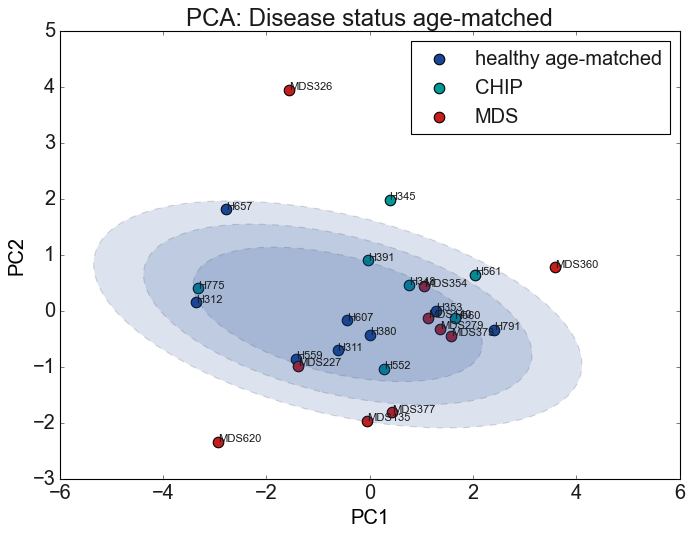

In [502]:
confidence_level = [0.65,0.85,0.95]
if bool_only_age_matched: 
    if bool_only_nonCHIP:
        #labels:
        comparison_str='Disease status age-matched non-CHIP'
        groups = ('healthy age-matched','MDS')
        groups_colors = [('healthy age-matched', col_H_a),('MDS', col_MDS)]
    else:
        #labels:
        comparison_str='Disease status age-matched'
        groups = ('healthy age-matched','CHIP','MDS')
        groups_colors = [('healthy age-matched', col_H_a),('CHIP', col_CHIP),('MDS', col_MDS)]
else:
    if bool_only_nonCHIP:
        #labels:
        comparison_str='Disease status all non-CHIP'
        groups = ('Healthy young','Healthy aged','MDS')
        groups_colors = [('Healthy young', col_H_y),('Healthy aged', col_H_a),('MDS', col_MDS)]
    else:
        #labels:
        comparison_str='Disease status all'
        groups = ('Healthy young','Healthy aged','CHIP','MDS')
        groups_colors = [('Healthy young', col_H_y),('Healthy aged', col_H_a),('CHIP', col_CHIP),('MDS', col_MDS)]     
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

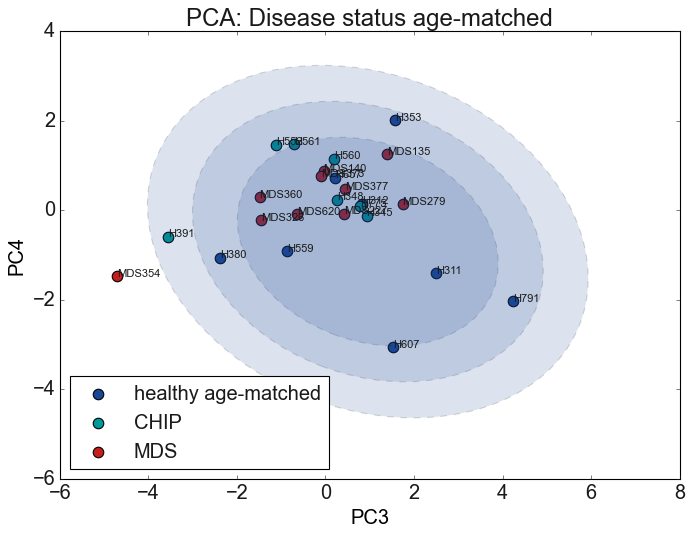

In [509]:
IDX_PCs=[2,3]
legend_loc = "lower left"
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

In [512]:
np.shape(Y_H_2)

(8, 21)

In [490]:
Y_H_2[:,0:2]

matrix([[-6.2188e-01, -6.9661e-01],
        [-3.3683e+00,  1.5644e-01],
        [ 1.2910e+00,  6.4936e-03],
        [ 2.1962e-03, -4.2003e-01],
        [-1.4291e+00, -8.4965e-01],
        [-4.4213e-01, -1.6553e-01],
        [-2.7825e+00,  1.8134e+00],
        [ 2.4008e+00, -3.3282e-01]])

In [485]:
S = np.empty_like(IDX_PCs)
M = np.empty_like(IDX_PCs)
for i,idx in enumerate(IDX_PCs):
    S[i] = np.std(Y_H_2[:,idx])
    M[i] = np.mean(Y_H_2[:,idx])
M

array([0, 0])

In [486]:
bool_plotIDs =False #

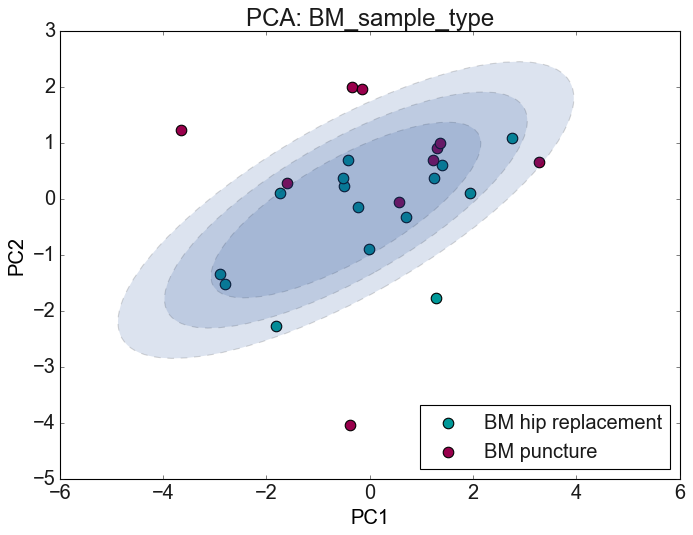

In [442]:
#labels:
comparison_str = 'BM_sample_type'
groups=DF['sample_type'].unique().tolist()
if len(groups)==2:  
    groups_colors=[(groups[0],'#009999'),(groups[1],'#99004C')]
else:
    groups_colors=[(groups[0],'#009999'),(groups[1],'#99004C'),(groups[2],'#CC6600')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


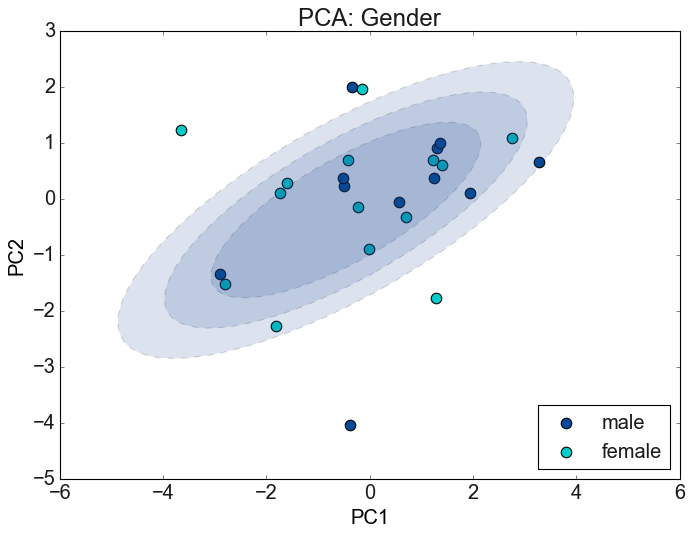

In [443]:
#labels:
comparison_str = 'Gender'
groups=('male','female')
groups_colors=[('male','#004C99'),('female','#00CCCC')]      
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


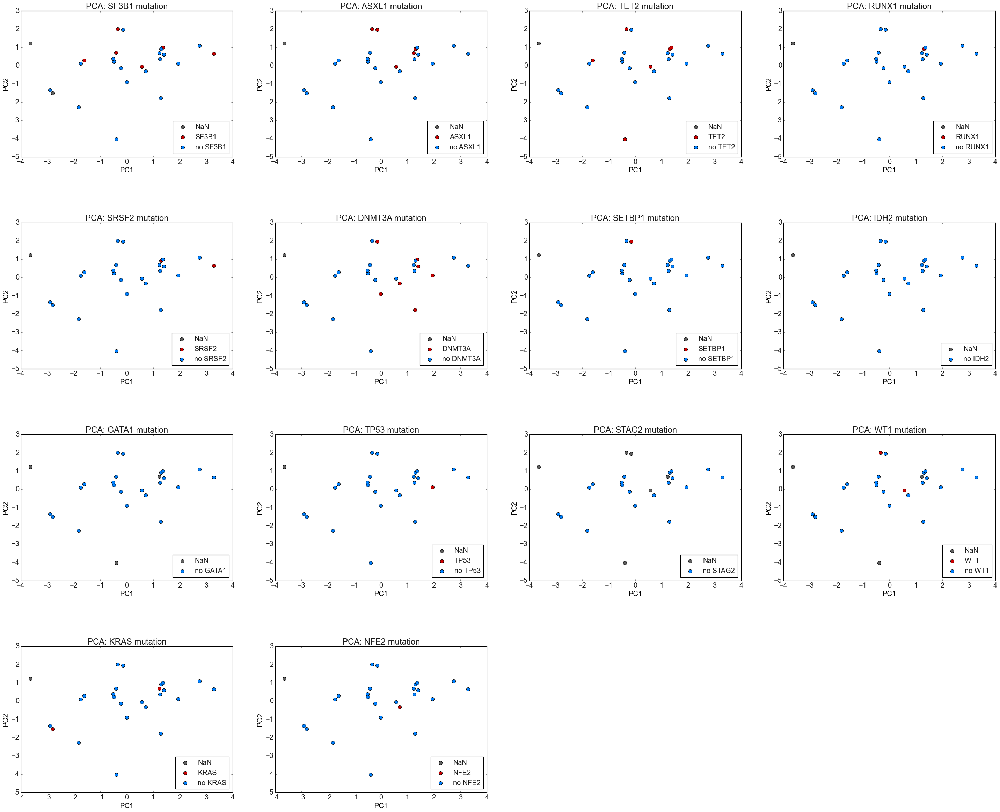

In [444]:
opt_mutation='combined'
FS=20
plot_PCA_2D_projection_allMutations(matlab_dir_str,folder_str_H_MDS,subfolder_str_H_MDS,DF,Y,Y_H_1,Y_H_2,opt_mutation,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,opt_sample_ID,W_H_1,W_H_2,confidence_level,opt_save)

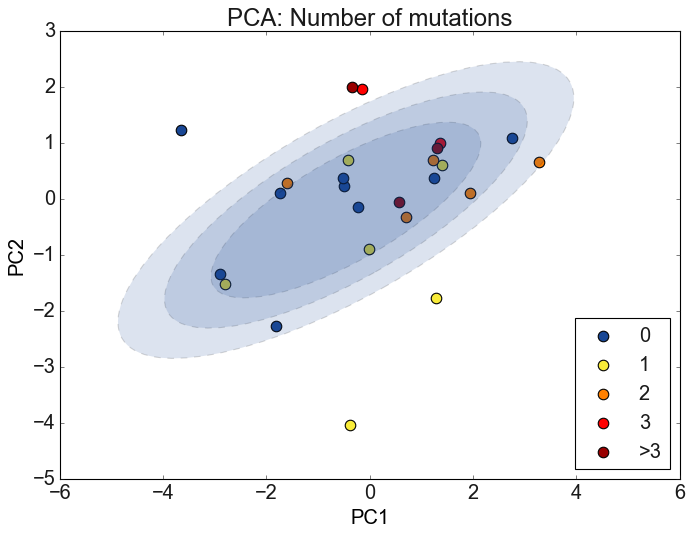

In [445]:
#labels:
comparison_str = 'Number of mutations'
groups=('0','1','2','3','>3')
groups_colors=[('0',col_H_a),('1','#F9EC39'),('2','#FF8000'),('3','#FF0000'),('>3','#990000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


In [446]:
#DF[['Sample_ID','Mutation_counts']]

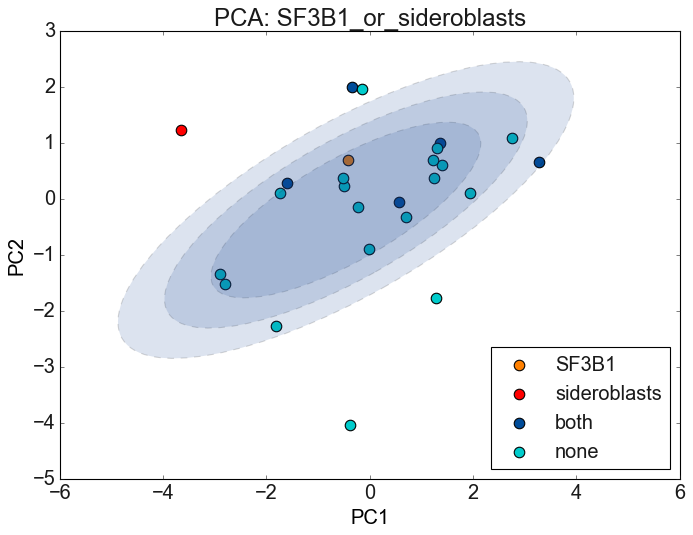

In [447]:
#labels:
comparison_str = 'SF3B1_or_sideroblasts'
groups=('SF3B1','sideroblasts','both','none')
groups_colors=[('SF3B1','#FF8000'),('sideroblasts','#FF0000'),('both','#004C99'),('none','#00CCCC')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


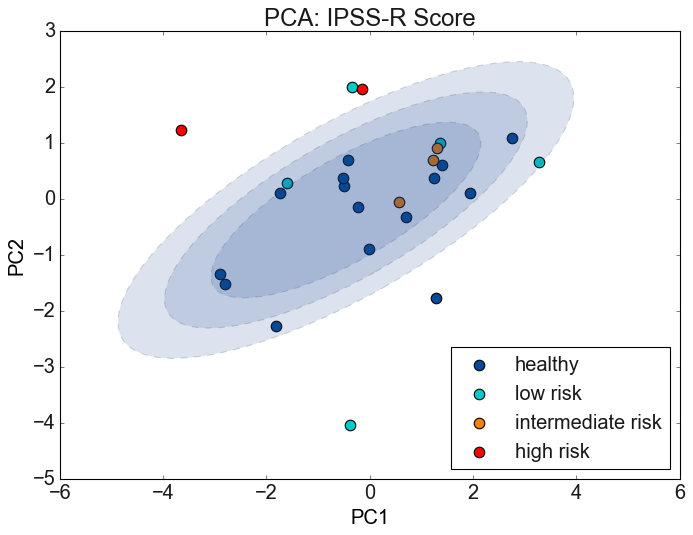

In [448]:
#labels:
comparison_str = 'IPSS-R Score'
groups=('healthy','low risk','intermediate risk','high risk','NaN')
groups_colors=[('healthy','#004C99'),('low risk','#00CCCC'),('intermediate risk','#FF8000'),('high risk','#FF0000'),('NaN','#808080')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


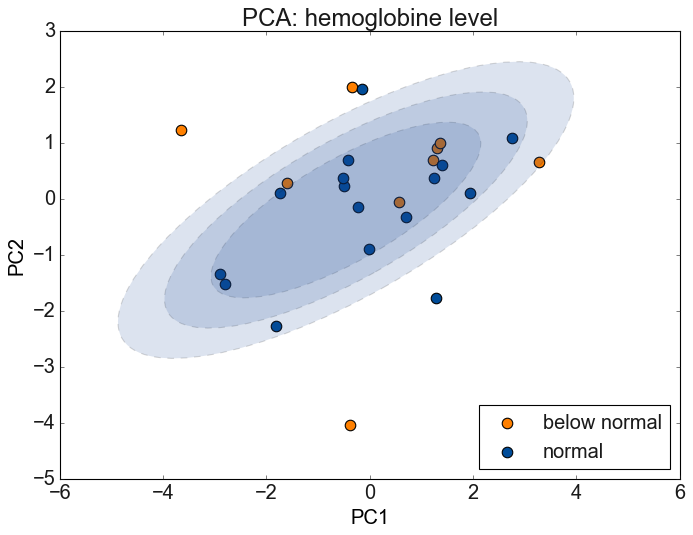

In [449]:
#labels:
comparison_str = 'hemoglobine level'
groups=('below normal','normal','increased')
groups_colors=[('below normal','#FF8000'),('normal','#004C99'),('increased','#CC0000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


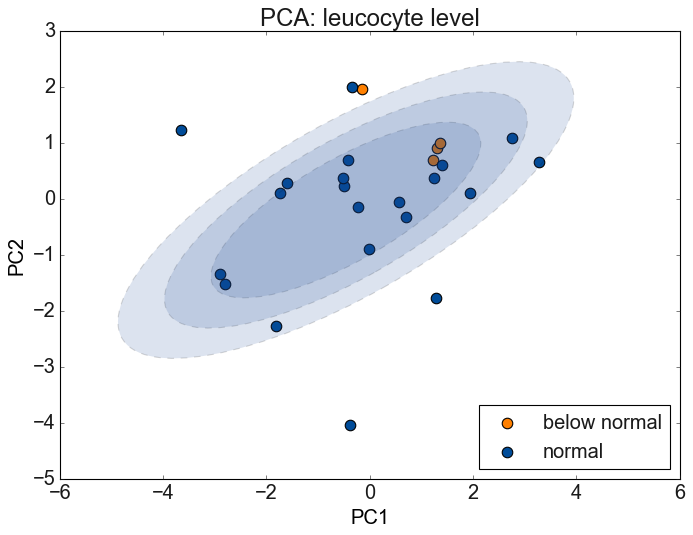

In [450]:
#labels:
comparison_str = 'leucocyte level'
groups=('below normal','normal','increased')
groups_colors=[('below normal','#FF8000'),('normal','#004C99'),('increased','#CC0000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)


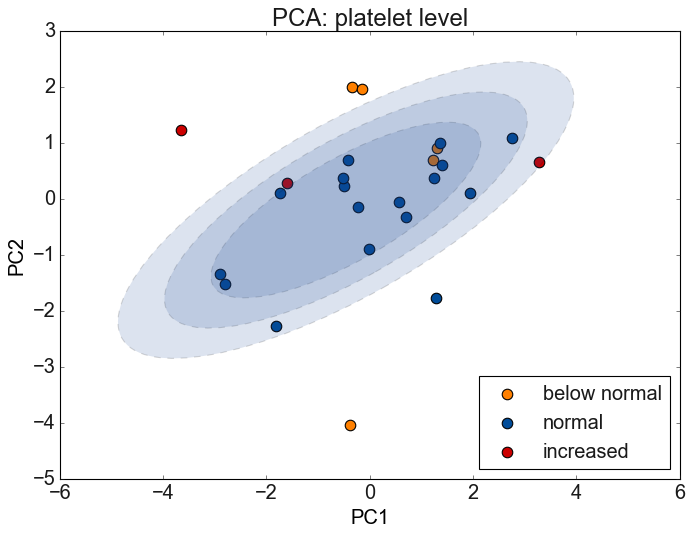

In [451]:
#labels:
comparison_str = 'platelet level'
groups=('below normal','normal','increased')
groups_colors=[('below normal','#FF8000'),('normal','#004C99'),('increased','#CC0000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

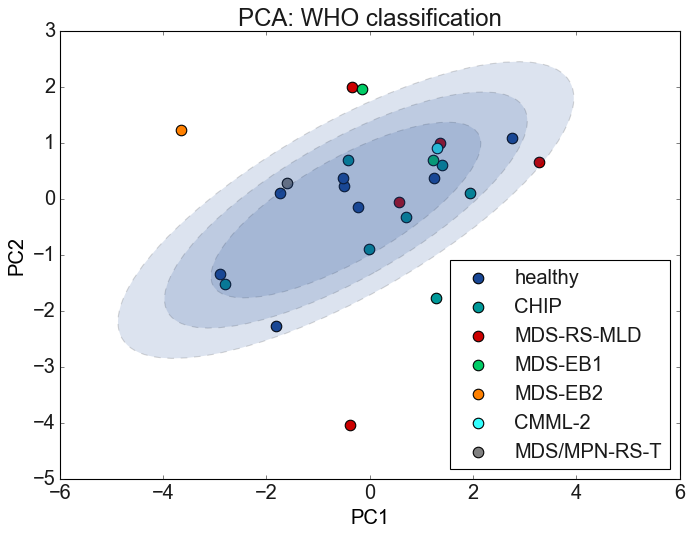

In [452]:
#labels:
comparison_str = 'WHO classification'
groups=('healthy','CHIP','MDS-RS-MLD','MDS-EB1','MDS-EB2','CMML-2','MDS/MPN-RS-T')
groups_colors=[('healthy','#194795'),('CHIP',col_CHIP),('MDS-RS-MLD','#CC0000'),('MDS-EB1','#00CC66'),('MDS-EB2','#FF8000'),('CMML-2','#33FFFF'),('MDS/MPN-RS-T','#808080')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

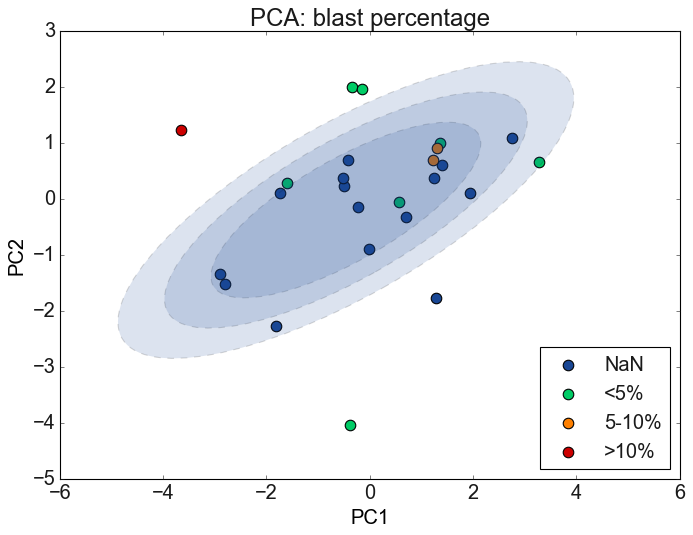

In [453]:
#labels:
comparison_str = 'blast percentage'
groups=('NaN','<5%','5-10%','>10%')
groups_colors=[('NaN','#194795'),('<5%','#00CC66'),('5-10%','#FF8000'),('>10%','#CC0000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

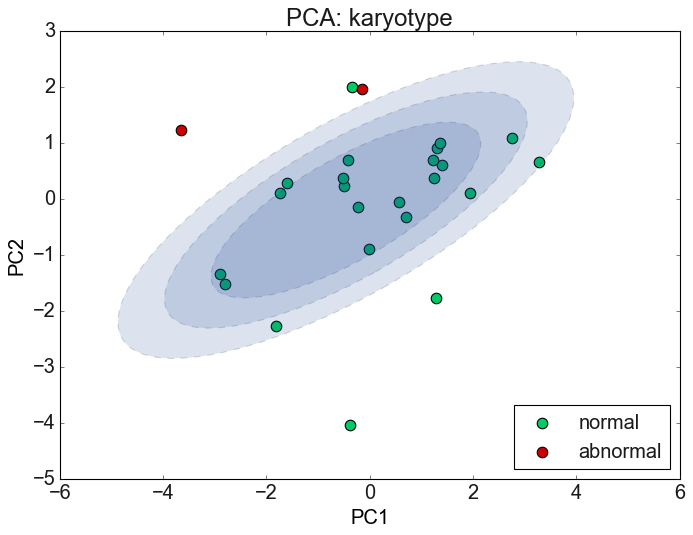

In [454]:
#labels:
comparison_str = 'karyotype'
groups=('normal','abnormal')
groups_colors=[('normal','#00CC66'),('abnormal','#CC0000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

In [455]:
os.chdir(dir_str)
#os.getcwd()
%run "definedFunctions.ipynb"

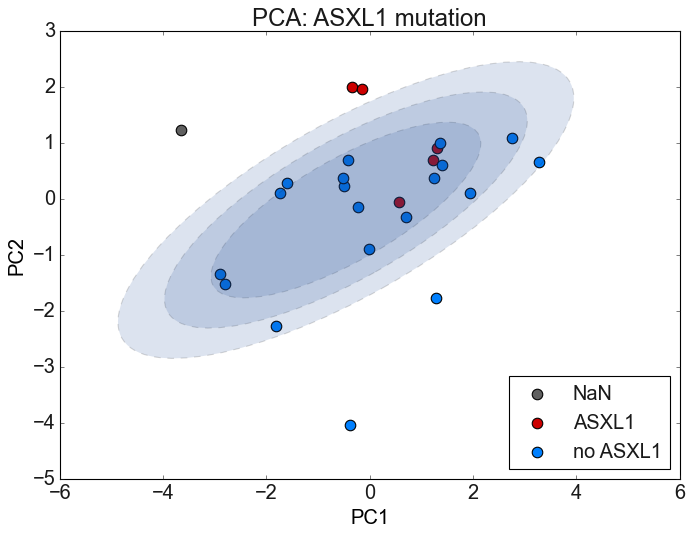

In [456]:
#for m_id in range(0,len(mutation_str)):
m_id=1
if opt_mutation == 'bulk':
    mut_ending = '_B'        
else:
    mut_ending = '_S'
mutation_str = df_PD.columns[df_PD.columns.str.endswith(mut_ending)]
if opt_mutation == 'combined':
    m_str = [mut_str[:-2] for mut_str in mutation_str]
    mutation_str = m_str
    
comparison_str, groups, groups_colors, y, s= get_mutation_labels(DF,mutation_str,m_id,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

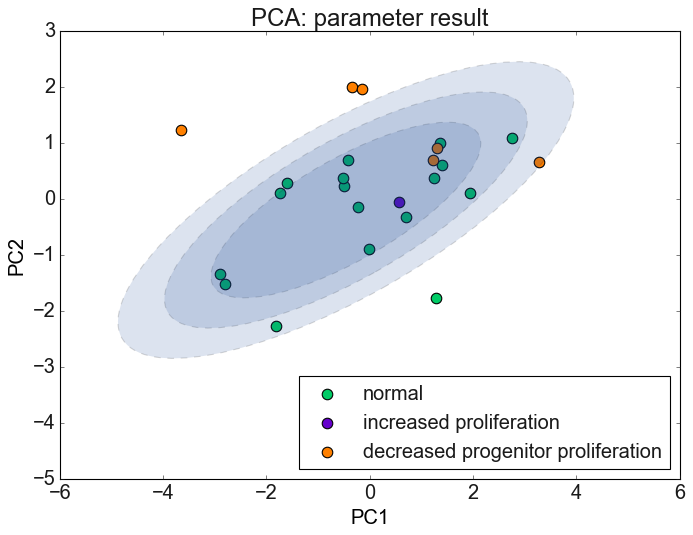

In [457]:
#labels:
comparison_str = 'parameter result'
groups=('normal','increased proliferation', 'decreased progenitor proliferation')
groups_colors=[('normal','#00CC66'),('increased proliferation','#6600CC'),('decreased progenitor proliferation','#FF8000')]
s,y = getValues4PCAplot(comparison_str,DF,groups,opt_sample_ID)
plot_PCA_2D_projection(matlab_dir_str, folder_str_H_MDS, subfolder_str_H_MDS,Y,Y_H_1,Y_H_2,y,s,groups,groups_colors,comparison_str,bool_plotIDs,bool_only_age_matched,IDX_PCs,add_file_str,legend_loc,W_H_1,W_H_2,confidence_level,opt_save)

### Model fits

In [432]:
#plt = loadPltSettings(30,10)

In [433]:
#plotModelFitToData(matlab_dir_str,folder_str_H_MDS,subfolder_str_H_MDS,subsubfolder_str_H_MDS,CT,cols_CT,False,opt_save)